#### Importing necessary libraries

In [166]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

In [167]:
warnings.filterwarnings("ignore")
color = sns.color_palette()

#### Reading the dataset

In [168]:
df = pd.read_excel('Customer Churn Data.xlsx',sheet_name=1)

In [169]:
df.head()

,AccountID,Churn,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
0,20000,1,4,3.0,6.0,Debit Card,Female,3.0,3,Super,2.0,Single,9,1.0,11,1,5,159.93,Mobile
1,20001,1,0,1.0,8.0,UPI,Male,3.0,4,Regular Plus,3.0,Single,7,1.0,15,0,0,120.9,Mobile
2,20002,1,0,1.0,30.0,Debit Card,Male,2.0,4,Regular Plus,3.0,Single,6,1.0,14,0,3,NaN,Mobile
3,20003,1,0,3.0,15.0,Debit Card,Male,2.0,4,Super,5.0,Single,8,0.0,23,0,3,134.07,Mobile
4,20004,1,0,1.0,12.0,Credit Card,Male,2.0,3,Regular Plus,5.0,Single,3,0.0,11,1,3,129.6,Mobile


#### Shape of the dataset

In [170]:
print(f'The dataset has {df.shape[0]} rows and {df.shape[1]} columns')

The dataset has 11260 rows and 19 columns


#### Info of the data

In [171]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11260 entries, 0 to 11259
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   AccountID                11260 non-null  int64  
 1   Churn                    11260 non-null  int64  
 2   Tenure                   11158 non-null  object 
 3   City_Tier                11148 non-null  float64
 4   CC_Contacted_LY          11158 non-null  float64
 5   Payment                  11151 non-null  object 
 6   Gender                   11152 non-null  object 
 7   Service_Score            11162 non-null  float64
 8   Account_user_count       11148 non-null  object 
 9   account_segment          11163 non-null  object 
 10  CC_Agent_Score           11144 non-null  float64
 11  Marital_Status           11048 non-null  object 
 12  rev_per_month            11158 non-null  object 
 13  Complain_ly              10903 non-null  float64
 14  rev_growth_yoy        

##### Observations:
<br>1- Tenure is supposed to be numeric but it is object data type
<br>2- Account_user_count supposed to be numeric but it is object data type
<br>3- rev_per_month supposed to be numeric but it is object data type
<br>4- rev_growth_yoy supposed to be numeric but it is object data type
<br>5- coupon_used_for_payment supposed to be numeric but it is object data type
<br>6- Day_Since_CC_connect supposed to be numeric but it is object data type
<br>7- cashback supposed to be numeric but it is object data type

#### Checking missing values

In [172]:
df.isna().sum()

AccountID                    0
Churn                        0
Tenure                     102
City_Tier                  112
CC_Contacted_LY            102
Payment                    109
Gender                     108
Service_Score               98
Account_user_count         112
account_segment             97
CC_Agent_Score             116
Marital_Status             212
rev_per_month              102
Complain_ly                357
rev_growth_yoy               0
coupon_used_for_payment      0
Day_Since_CC_connect       357
cashback                   471
Login_device               221
dtype: int64

### Basic summary statistics

In [173]:
df.drop(['AccountID','Churn'],axis=1).describe()

,City_Tier,CC_Contacted_LY,Service_Score,CC_Agent_Score,Complain_ly
count,11148.000000,11158.000000,11162.000000,11144.000000,10903.000000
mean,1.653929,17.867091,2.902526,3.066493,0.285334
std,0.915015,8.853269,0.725584,1.379772,0.451594
min,1.000000,4.000000,0.000000,1.000000,0.000000
25%,1.000000,11.000000,2.000000,2.000000,0.000000
50%,1.000000,16.000000,3.000000,3.000000,0.000000
75%,3.000000,23.000000,3.000000,4.000000,1.000000
max,3.000000,132.000000,5.000000,5.000000,1.000000


Many integer or float datadtype fields are not being pulled in the describe method so we need to see the reason behind it

In [174]:
df['Tenure'].unique()

array([4, 0, 2, 13, 11, '#', 9, 99, 19, 20, 14, 8, 26, 18, 5, 30, 7, 1,
       23, 3, 29, 6, 28, 24, 25, 16, 10, 15, 22, nan, 27, 12, 21, 17, 50,
       60, 31, 51, 61], dtype=object)

In [175]:
df['Account_user_count'].unique()

array([3, 4, nan, 5, 2, '@', 1, 6], dtype=object)

In [176]:
df['rev_per_month'].unique()

array([9, 7, 6, 8, 3, 2, 4, 10, 1, 5, '+', 130, nan, 19, 139, 102, 120,
       138, 127, 123, 124, 116, 21, 126, 134, 113, 114, 108, 140, 133,
       129, 107, 118, 11, 105, 20, 119, 121, 137, 110, 22, 101, 136, 125,
       14, 13, 12, 115, 23, 122, 117, 131, 104, 15, 25, 135, 111, 109,
       100, 103], dtype=object)

In [177]:
df['rev_growth_yoy'].unique()

array([11, 15, 14, 23, 22, 16, 12, 13, 17, 18, 24, 19, 20, 21, 25, 26,
       '$', 4, 27, 28], dtype=object)

In [178]:
df['coupon_used_for_payment'].unique()

array([1, 0, 4, 2, 9, 6, 11, 7, 12, 10, 5, 3, 13, 15, 8, '#', '$', 14,
       '*', 16], dtype=object)

In [179]:
df['Day_Since_CC_connect'].unique()

array([5, 0, 3, 7, 2, 1, 8, 6, 4, 15, nan, 11, 10, 9, 13, 12, 17, 16, 14,
       30, '$', 46, 18, 31, 47], dtype=object)

In [180]:
print(df['cashback'].unique().tolist())

[159.93, 120.9, nan, 134.07, 129.6, 139.19, 120.86000000000001, 122.93, 126.83000000000001, 295.45, 153.81, 134.41, 133.88, 196.19, 120.72999999999999, 129.26, 157.44, 160.74, 149.63, 161.72, 203.12, 116.75, 206.5, 142, 172.95, 123.06, 123.47999999999999, 189.98, 143.19, 1974, 133.46, 208.55, 122.31, 123.22999999999999, 120.24000000000001, 127.13, 194.39, 125.66, 299.26, 124.50999999999999, 194.19, 186.86, 130.38, 130.58, 123.25, 120.88, 130.72, 150.06, 142.57, 125, 111.02000000000001, 204.53, 122.88, 139.29, 123.11000000000001, 131.4, 144.5, 127.56, 290.33, 287.22, 195.47, 237.33999999999997, 299.99, 122.78999999999999, 159.16, 120.88999999999999, 267.92, 135.64, 144.25, 152.65, 165.53, 162.61, 142.98, 168.04, 138.15, 127.41, 166.73, 176.39, 123.28, 121.53, 148.76, 193.96, 204, 184.74, 199.81, 224.89999999999998, 126.57, 235.91000000000003, 166.96, 120.58000000000001, 188.65, 159.4, 159.14, 126.22, 221.85000000000002, 206.08999999999997, 143.45, 121.77000000000001, 0, 179.18, 187.89, 

#### Replacing the garbage characters with nan

In [181]:
df['Tenure'] = np.where(df['Tenure']=='#',pd.NA,df['Tenure'])
#df['Tenure'] = df['Tenure'].astype('int64')

In [182]:
df['Tenure'].unique()

array([4, 0, 2, 13, 11, <NA>, 9, 99, 19, 20, 14, 8, 26, 18, 5, 30, 7, 1,
       23, 3, 29, 6, 28, 24, 25, 16, 10, 15, 22, nan, 27, 12, 21, 17, 50,
       60, 31, 51, 61], dtype=object)

In [183]:
df['Tenure'] = df['Tenure'].apply(pd.to_numeric)

In [184]:
df['Account_user_count'] = np.where(df['Account_user_count']=='@',pd.NA,df['Account_user_count'])
df['Account_user_count'] = df['Account_user_count'].apply(pd.to_numeric)
df['Account_user_count'].unique()

array([ 3.,  4., nan,  5.,  2.,  1.,  6.])

In [185]:
df['rev_per_month'] = np.where(df['rev_per_month']=='+',pd.NA,df['rev_per_month'])
df['rev_per_month'] = df['rev_per_month'].apply(pd.to_numeric)
df['rev_per_month'].unique()

array([  9.,   7.,   6.,   8.,   3.,   2.,   4.,  10.,   1.,   5.,  nan,
       130.,  19., 139., 102., 120., 138., 127., 123., 124., 116.,  21.,
       126., 134., 113., 114., 108., 140., 133., 129., 107., 118.,  11.,
       105.,  20., 119., 121., 137., 110.,  22., 101., 136., 125.,  14.,
        13.,  12., 115.,  23., 122., 117., 131., 104.,  15.,  25., 135.,
       111., 109., 100., 103.])

In [186]:
df['rev_growth_yoy'] = np.where(df['rev_growth_yoy']=='$',pd.NA,df['rev_growth_yoy'])
df['rev_growth_yoy'] = df['rev_growth_yoy'].apply(pd.to_numeric)
df['rev_growth_yoy'].unique()

array([11., 15., 14., 23., 22., 16., 12., 13., 17., 18., 24., 19., 20.,
       21., 25., 26., nan,  4., 27., 28.])

In [187]:
df['coupon_used_for_payment'] = np.where(df['coupon_used_for_payment']=='#',pd.NA,df['coupon_used_for_payment'])
df['coupon_used_for_payment'] = np.where(df['coupon_used_for_payment']=='$',pd.NA,df['coupon_used_for_payment'])
df['coupon_used_for_payment'] = np.where(df['coupon_used_for_payment']=='*',pd.NA,df['coupon_used_for_payment'])
df['coupon_used_for_payment'] = df['coupon_used_for_payment'].apply(pd.to_numeric)
df['coupon_used_for_payment'].unique()

array([ 1.,  0.,  4.,  2.,  9.,  6., 11.,  7., 12., 10.,  5.,  3., 13.,
       15.,  8., nan, 14., 16.])

In [188]:
df['cashback'] = np.where(df['cashback']=='$',pd.NA,df['cashback'])
df['cashback'] = df['cashback'].apply(pd.to_numeric)

In [189]:
df['Day_Since_CC_connect'] = np.where(df['Day_Since_CC_connect']=='$',pd.NA,df['Day_Since_CC_connect'])
df['Day_Since_CC_connect'] = df['Day_Since_CC_connect'].apply(pd.to_numeric)
df['Day_Since_CC_connect'].unique()

array([ 5.,  0.,  3.,  7.,  2.,  1.,  8.,  6.,  4., 15., nan, 11., 10.,
        9., 13., 12., 17., 16., 14., 30., 46., 18., 31., 47.])

In [190]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11260 entries, 0 to 11259
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   AccountID                11260 non-null  int64  
 1   Churn                    11260 non-null  int64  
 2   Tenure                   11042 non-null  float64
 3   City_Tier                11148 non-null  float64
 4   CC_Contacted_LY          11158 non-null  float64
 5   Payment                  11151 non-null  object 
 6   Gender                   11152 non-null  object 
 7   Service_Score            11162 non-null  float64
 8   Account_user_count       10816 non-null  float64
 9   account_segment          11163 non-null  object 
 10  CC_Agent_Score           11144 non-null  float64
 11  Marital_Status           11048 non-null  object 
 12  rev_per_month            10469 non-null  float64
 13  Complain_ly              10903 non-null  float64
 14  rev_growth_yoy        

In [191]:
# Now we can try pulling the summary statistics again
df.drop(['AccountID','Churn'],axis=1).describe()

,Tenure,City_Tier,CC_Contacted_LY,Service_Score,Account_user_count,CC_Agent_Score,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback
count,11042.000000,11148.000000,11158.000000,11162.000000,10816.000000,11144.000000,10469.000000,10903.000000,11257.000000,11257.000000,10902.000000,10787.000000
mean,11.025086,1.653929,17.867091,2.902526,3.692862,3.066493,6.362594,0.285334,16.193391,1.790619,4.633187,196.236370
std,12.879782,0.915015,8.853269,0.725584,1.022976,1.379772,11.909686,0.451594,3.757721,1.969551,3.697637,178.660514
min,0.000000,1.000000,4.000000,0.000000,1.000000,1.000000,1.000000,0.000000,4.000000,0.000000,0.000000,0.000000
25%,2.000000,1.000000,11.000000,2.000000,3.000000,2.000000,3.000000,0.000000,13.000000,1.000000,2.000000,147.210000
50%,9.000000,1.000000,16.000000,3.000000,4.000000,3.000000,5.000000,0.000000,15.000000,1.000000,3.000000,165.250000
75%,16.000000,3.000000,23.000000,3.000000,4.000000,4.000000,7.000000,1.000000,19.000000,2.000000,8.000000,200.010000
max,99.000000,3.000000,132.000000,5.000000,6.000000,5.000000,140.000000,1.000000,28.000000,16.000000,47.000000,1997.000000


In [192]:
df.drop(['AccountID','Churn'],axis=1).describe(include='all')

,Tenure,City_Tier,CC_Contacted_LY,Payment,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,Marital_Status,rev_per_month,Complain_ly,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,Login_device
count,11042.000000,11148.000000,11158.000000,11151,11152,11162.000000,10816.000000,11163,11144.000000,11048,10469.000000,10903.000000,11257.000000,11257.000000,10902.000000,10787.000000,11039
unique,NaN,NaN,NaN,5,4,NaN,NaN,7,NaN,3,NaN,NaN,NaN,NaN,NaN,NaN,3
top,NaN,NaN,NaN,Debit Card,Male,NaN,NaN,Super,NaN,Married,NaN,NaN,NaN,NaN,NaN,NaN,Mobile
freq,NaN,NaN,NaN,4587,6328,NaN,NaN,4062,NaN,5860,NaN,NaN,NaN,NaN,NaN,NaN,7482
mean,11.025086,1.653929,17.867091,NaN,NaN,2.902526,3.692862,NaN,3.066493,NaN,6.362594,0.285334,16.193391,1.790619,4.633187,196.236370,NaN
std,12.879782,0.915015,8.853269,NaN,NaN,0.725584,1.022976,NaN,1.379772,NaN,11.909686,0.451594,3.757721,1.969551,3.697637,178.660514,NaN
min,0.000000,1.000000,4.000000,NaN,NaN,0.000000,1.000000,NaN,1.000000,NaN,1.000000,0.000000,4.000000,0.000000,0.000000,0.000000,NaN
25%,2.000000,1.000000,11.000000,NaN,NaN,2.000000,3.000000,NaN,2.000000,NaN,3.000000,0.000000,13.000000,1.000000,2.000000,147.210000,NaN
50%,9.000000,1.000000,16.000000,NaN,NaN,3.000000,4.000000,NaN,3.000000,NaN,5.000000,0.000000,15.000000,1.000000,3.000000,165.250000,NaN
75%,16.000000,3.000000,23.000000,NaN,NaN,3.000000,4.000000,NaN,4.000000,NaN,7.000000,1.000000,19.000000,2.000000,8.000000,200.010000,NaN


import sys
!{sys.executable} -m pip install pandas-profiling

In [193]:
from pandas_profiling import ProfileReport

In [194]:
profile = ProfileReport(df, title="Pandas Profiling Report", explorative=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Checking duplicates

In [195]:
df.duplicated().sum()

0

#### Fixing the object/categorical values to more managable values

In [196]:
df['Payment'].unique()

array(['Debit Card', 'UPI', 'Credit Card', 'Cash on Delivery', 'E wallet',
       nan], dtype=object)

In [197]:
df['Gender'].unique()

array(['Female', 'Male', 'F', nan, 'M'], dtype=object)

In [198]:
df['Gender'] = np.where(df['Gender']=='Female','F',df['Gender'])
df['Gender'] = np.where(df['Gender']=='Male','M',df['Gender'])
df['Gender'].unique()

array(['F', 'M', nan], dtype=object)

In [199]:
df['account_segment'].unique()

array(['Super', 'Regular Plus', 'Regular', 'HNI', 'Regular +', nan,
       'Super Plus', 'Super +'], dtype=object)

In [200]:
df['account_segment'] = np.where(df['account_segment']=='Regular Plus','Regular_Plus',df['account_segment'])
df['account_segment'] = np.where(df['account_segment']=='Regular +','Regular_Plus',df['account_segment'])
df['account_segment'] = np.where(df['account_segment']=='Super Plus','Super_Plus',df['account_segment'])
df['account_segment'] = np.where(df['account_segment']=='Super +','Super_Plus',df['account_segment'])
df['account_segment'].unique()

array(['Super', 'Regular_Plus', 'Regular', 'HNI', nan, 'Super_Plus'],
      dtype=object)

In [201]:
df['Marital_Status'].unique()

array(['Single', 'Divorced', 'Married', nan], dtype=object)

In [202]:
df['Login_device'].unique()

array(['Mobile', 'Computer', '&&&&', nan], dtype=object)

In [203]:
df['Login_device'] = np.where(df['Login_device']=='&&&&',np.nan,df['Login_device'])
df['Login_device'].unique()

array(['Mobile', 'Computer', nan], dtype=object)

#### Checking the missing values again since we changed the garbage values with nan

In [204]:
df.isna().sum()

AccountID                    0
Churn                        0
Tenure                     218
City_Tier                  112
CC_Contacted_LY            102
Payment                    109
Gender                     108
Service_Score               98
Account_user_count         444
account_segment             97
CC_Agent_Score             116
Marital_Status             212
rev_per_month              791
Complain_ly                357
rev_growth_yoy               3
coupon_used_for_payment      3
Day_Since_CC_connect       358
cashback                   473
Login_device               760
dtype: int64

### Univariate analysis of numeric columns

In [205]:
num_cols = ['Tenure','CC_Contacted_LY','Service_Score','Account_user_count','CC_Agent_Score','rev_per_month','rev_growth_yoy','coupon_used_for_payment','Day_Since_CC_connect','cashback']

Although City_Tier and Complain_ly are numeric data type but these both are categorical in nature

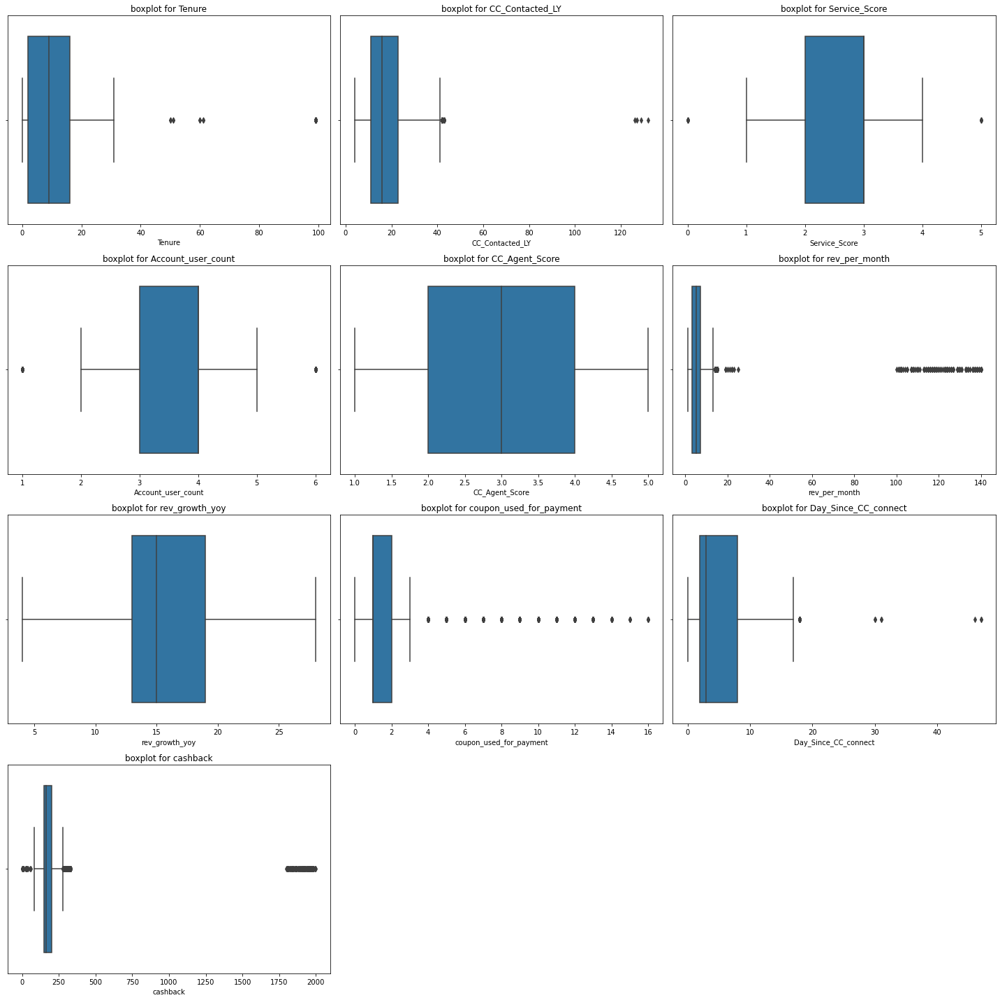

In [206]:
fig=plt.figure(figsize=(20,20))
for i in range(0,len(num_cols)):
    ax=fig.add_subplot(4,3,i+1)
    sns.boxplot(df[num_cols[i]])
    plt.title(f'boxplot for {num_cols[i]}')
    plt.tight_layout()

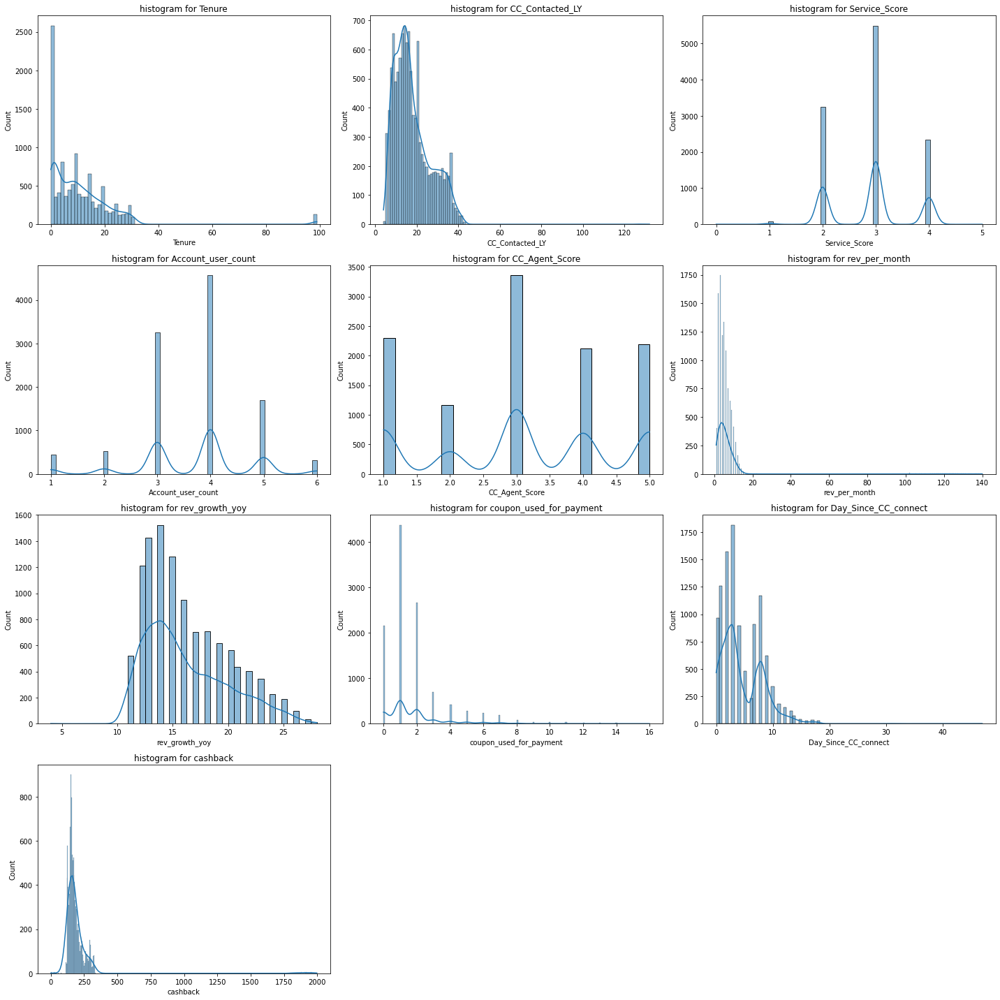

In [207]:
fig=plt.figure(figsize=(20,20))
for i in range(0,len(num_cols)):
    ax=fig.add_subplot(4,3,i+1)
    sns.histplot(data=df, x=num_cols[i],kde=True)
    plt.title(f'histogram for {num_cols[i]}')
    plt.tight_layout()

### Univariate analysis for categorical/object variables

In [208]:
df['Churn'].value_counts()

0    9364
1    1896
Name: Churn, dtype: int64

In [209]:
df['Churn'].value_counts(normalize=True)

0    0.831616
1    0.168384
Name: Churn, dtype: float64

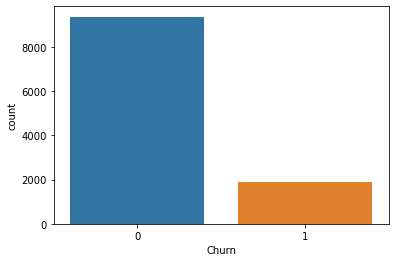

In [210]:
sns.countplot(x=df['Churn']);

In [211]:
df['City_Tier'].value_counts()

1.0    7263
3.0    3405
2.0     480
Name: City_Tier, dtype: int64

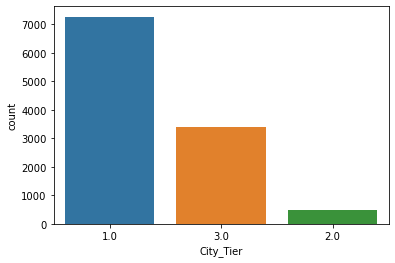

In [212]:
sns.countplot(x=df['City_Tier'],order=df['City_Tier'].value_counts().index);

In [213]:
df['Payment'].value_counts()

Debit Card          4587
Credit Card         3511
E wallet            1217
Cash on Delivery    1014
UPI                  822
Name: Payment, dtype: int64

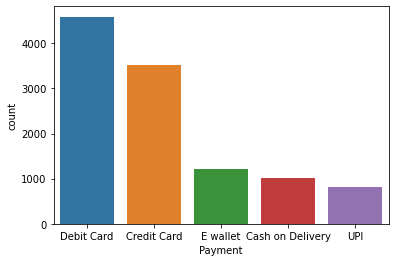

In [214]:
sns.countplot(x=df['Payment'],order=df['Payment'].value_counts().index);

In [215]:
df['Gender'].value_counts()

M    6704
F    4448
Name: Gender, dtype: int64

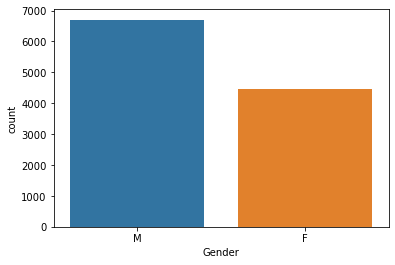

In [216]:
sns.countplot(x=df['Gender'],order=df['Gender'].value_counts().index);

In [217]:
df['account_segment'].value_counts()

Regular_Plus    4124
Super           4062
HNI             1639
Super_Plus       818
Regular          520
Name: account_segment, dtype: int64

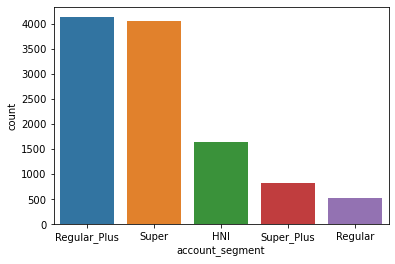

In [218]:
sns.countplot(x=df['account_segment'],order=df['account_segment'].value_counts().index);

In [219]:
df['Marital_Status'].value_counts()

Married     5860
Single      3520
Divorced    1668
Name: Marital_Status, dtype: int64

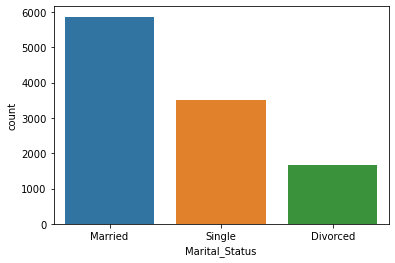

In [220]:
sns.countplot(x=df['Marital_Status'],order=df['Marital_Status'].value_counts().index);

In [221]:
df['Complain_ly'].value_counts()

0.0    7792
1.0    3111
Name: Complain_ly, dtype: int64

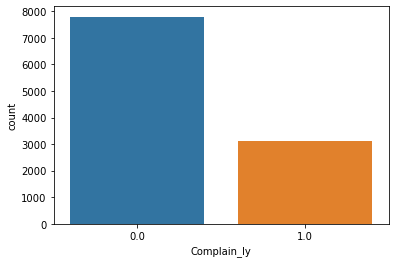

In [222]:
sns.countplot(x=df['Complain_ly'],order=df['Complain_ly'].value_counts().index);

In [223]:
df['Login_device'].value_counts()

Mobile      7482
Computer    3018
Name: Login_device, dtype: int64

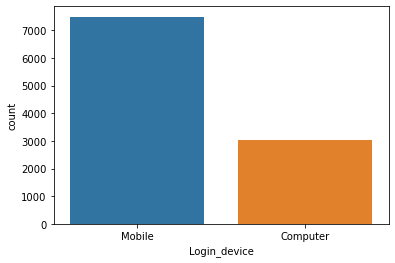

In [224]:
sns.countplot(x=df['Login_device'],order=df['Login_device'].value_counts().index);

### Imputing the NULL values

In [225]:
df.isna().sum()

AccountID                    0
Churn                        0
Tenure                     218
City_Tier                  112
CC_Contacted_LY            102
Payment                    109
Gender                     108
Service_Score               98
Account_user_count         444
account_segment             97
CC_Agent_Score             116
Marital_Status             212
rev_per_month              791
Complain_ly                357
rev_growth_yoy               3
coupon_used_for_payment      3
Day_Since_CC_connect       358
cashback                   473
Login_device               760
dtype: int64

We can impute the NULL values using SimpleImputer. For the distance based models, we can impute the NULL values using KNN imputer

In [226]:
from sklearn.impute import SimpleImputer

In [227]:
df1 = df.copy
df2 = df.copy

In [228]:
imputer = SimpleImputer(strategy='median')

In [229]:
df[['Tenure','CC_Contacted_LY','Account_user_count','rev_per_month','rev_growth_yoy','coupon_used_for_payment','Day_Since_CC_connect','cashback']] = imputer.fit_transform(df[['Tenure','CC_Contacted_LY','Account_user_count','rev_per_month','rev_growth_yoy','coupon_used_for_payment','Day_Since_CC_connect','cashback']])

In [230]:
imputer = SimpleImputer(strategy='most_frequent')

In [231]:
df[['City_Tier','Payment','Gender','Service_Score','account_segment','CC_Agent_Score','Marital_Status','Complain_ly','Login_device']] = imputer.fit_transform(df[['City_Tier','Payment','Gender','Service_Score','account_segment','CC_Agent_Score','Marital_Status','Complain_ly','Login_device']])

In [232]:
df.isna().sum()

AccountID                  0
Churn                      0
Tenure                     0
City_Tier                  0
CC_Contacted_LY            0
Payment                    0
Gender                     0
Service_Score              0
Account_user_count         0
account_segment            0
CC_Agent_Score             0
Marital_Status             0
rev_per_month              0
Complain_ly                0
rev_growth_yoy             0
coupon_used_for_payment    0
Day_Since_CC_connect       0
cashback                   0
Login_device               0
dtype: int64

### Outlier treatment

1- For Tenure if we consider that the given values are in years then there are values that are unrealistically large because DTH technology is not very old so we will treat the outliers
<br>2- CC_Contacted_LY seems to have genuine values as there can be customers who faced difficulty in the service many times and there can be who faced less number of times so we will not treat outliers for this feature.
<br>3- Service score is kind of ordinal feature so no need to treat outliers.
<br>4- Account_user_count also don't have significant outliers so no need to treat outliers.
<br>5- rev_per_month have some unusual values because it has values from 1 ro 22 and then no value from 23 to 101 and then suddenly there are values from 102 to 140. We will treat the outliers for this column.
<br>6- Values for coupon_used_for_payment looks genuine so not treating it for outliers
<br>7- Very few outliers in Day_Since_CC_connect but these values may be genuine because it is possible that some happy customers have not contacted the customer care as either they are happy or frustrated customers who have given up so not treating it for outliers.
<br>8- cashback column seems to have some extreme outliers and these amount seems oddly high so we are going to treat outliers.

In [233]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=col.quantile([0.25,0.75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [234]:
out = ['Tenure', 'rev_per_month', 'cashback']

In [235]:
for column in out:
    lr,ur=remove_outlier(df[column])
    df[column]=np.where(df[column]>ur,ur,df[column])
    df[column]=np.where(df[column]<lr,lr,df[column])

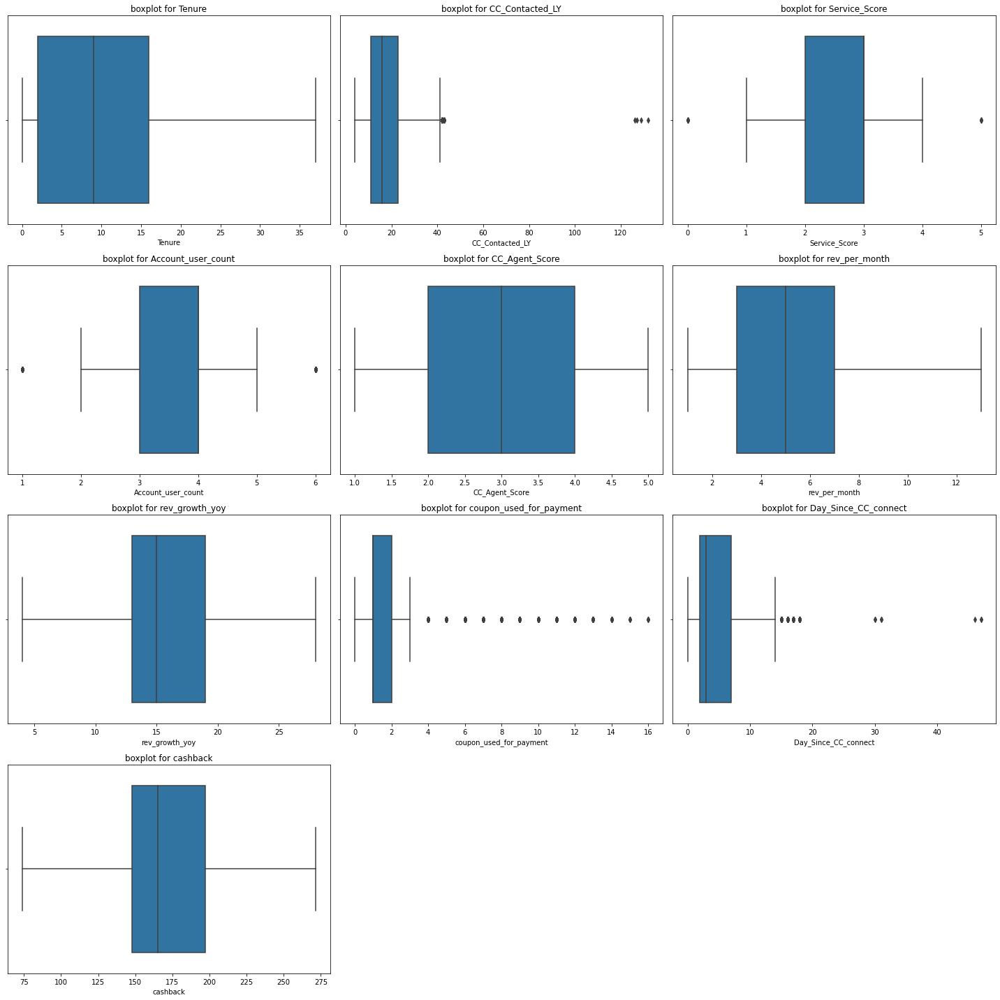

In [236]:
fig=plt.figure(figsize=(20,20))
for i in range(0,len(num_cols)):
    ax=fig.add_subplot(4,3,i+1)
    sns.boxplot(df[num_cols[i]])
    plt.title(f'boxplot for {num_cols[i]}')
    plt.tight_layout()

### Bivariate Analysis

In [237]:
dfn = df.drop('AccountID',axis=1)

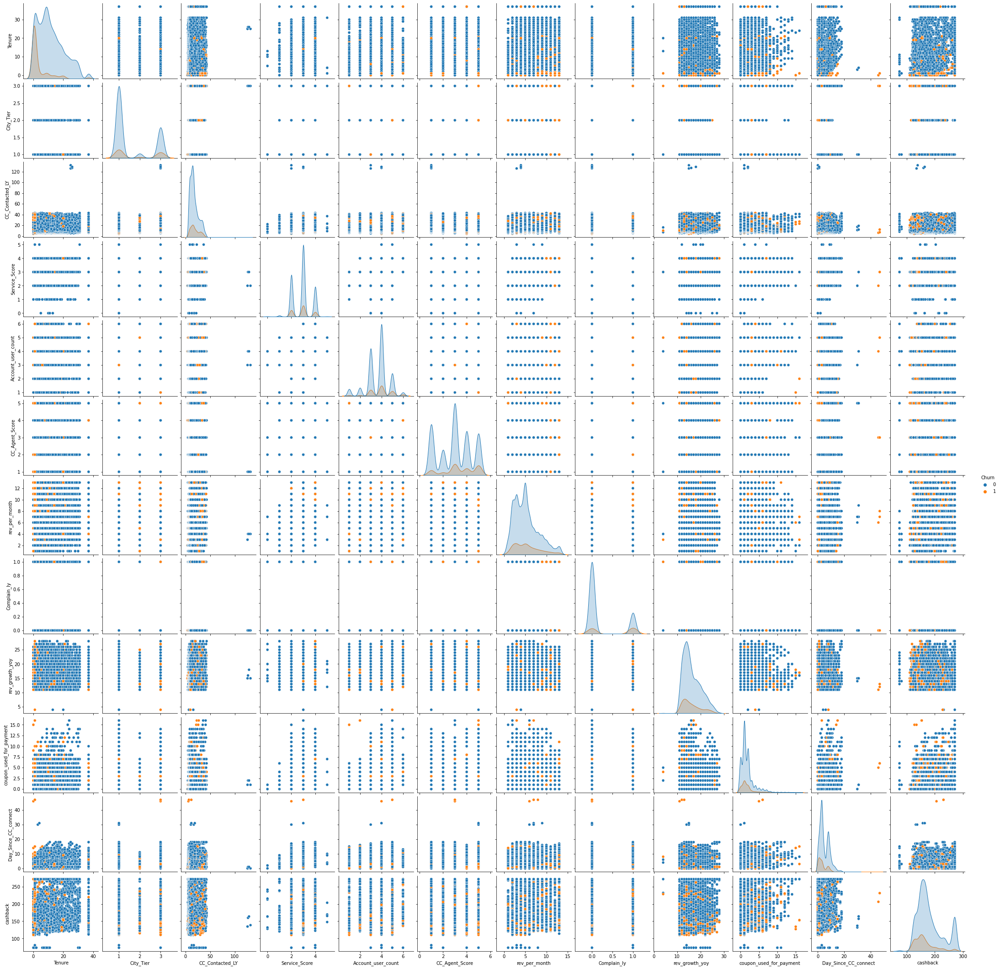

In [238]:
sns.pairplot(data=dfn,hue='Churn');

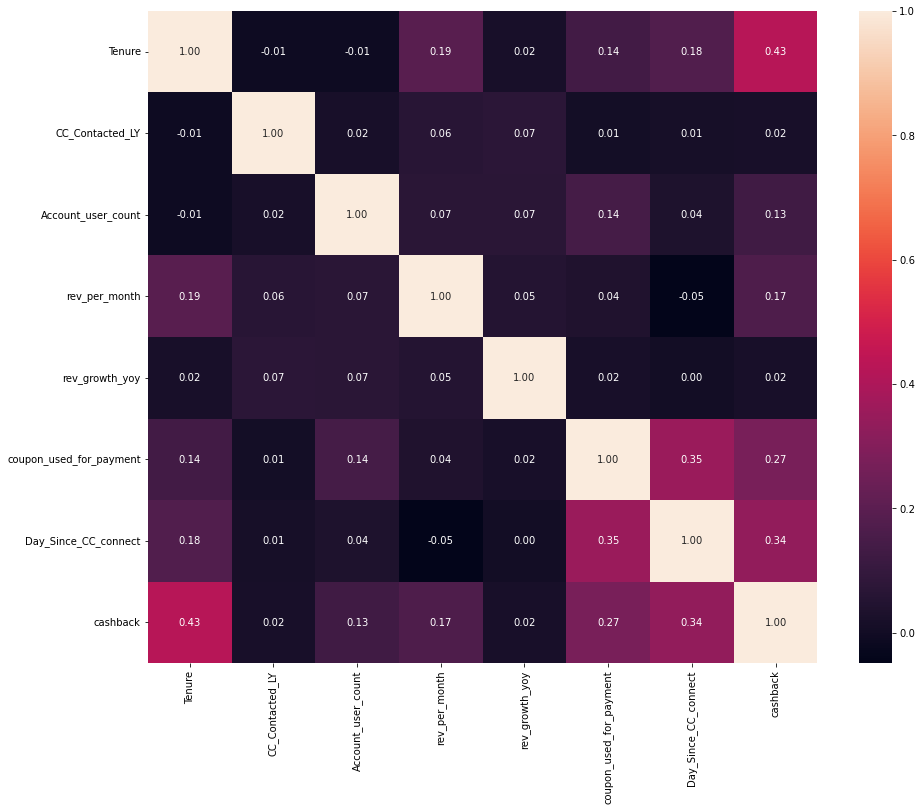

In [239]:
plt.figure(figsize=(15,12));
sns.heatmap(df.drop(['AccountID','Churn'],axis=1).corr(),annot=True,fmt='.2f');

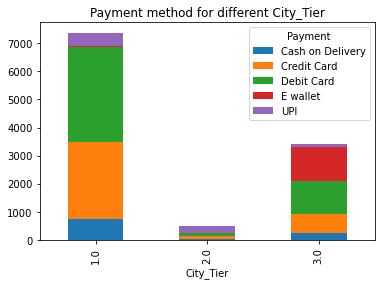

In [240]:
pd.crosstab(df['City_Tier'],df['Payment']).plot(kind='bar',stacked=True);
plt.title('Payment method for different City_Tier');

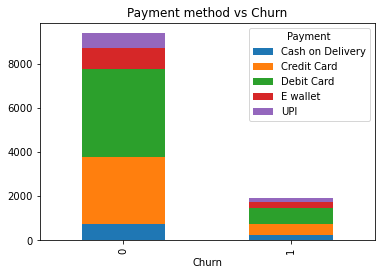

In [241]:
pd.crosstab(df['Churn'],df['Payment']).plot(kind='bar',stacked=True);
plt.title('Payment method vs Churn');

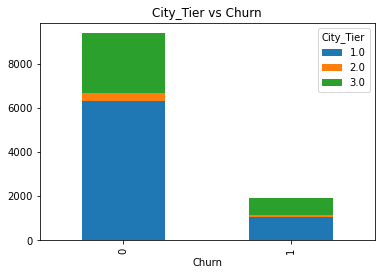

In [242]:
pd.crosstab(df['Churn'],df['City_Tier']).plot(kind='bar',stacked=True);
plt.title('City_Tier vs Churn');

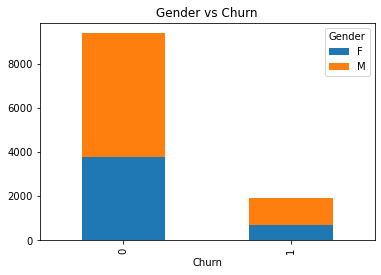

In [243]:
pd.crosstab(df['Churn'],df['Gender']).plot(kind='bar',stacked=True);
plt.title('Gender vs Churn');

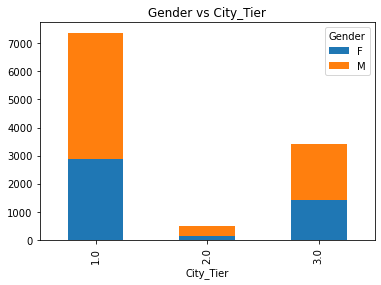

In [244]:
pd.crosstab(df['City_Tier'],df['Gender']).plot(kind='bar',stacked=True);
plt.title('Gender vs City_Tier');

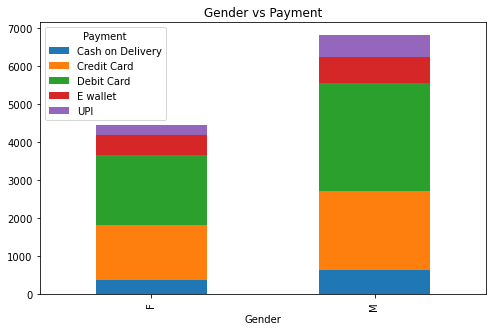

In [245]:
pd.crosstab(df['Gender'],df['Payment']).plot(kind='bar',stacked=True,figsize=(8,5));
plt.title('Gender vs Payment');

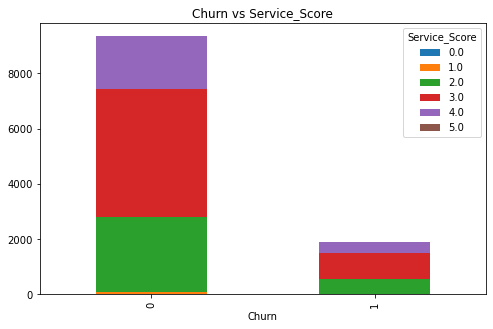

In [246]:
pd.crosstab(df['Churn'],df['Service_Score']).plot(kind='bar',stacked=True,figsize=(8,5));
plt.title('Churn vs Service_Score');

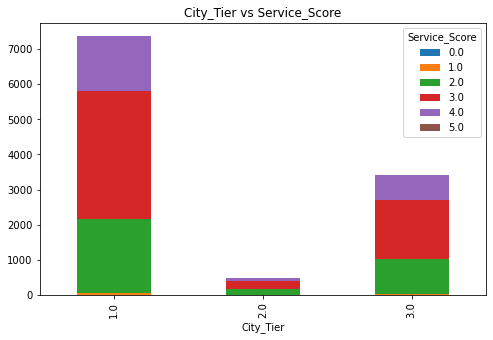

In [247]:
pd.crosstab(df['City_Tier'],df['Service_Score']).plot(kind='bar',stacked=True,figsize=(8,5));
plt.title('City_Tier vs Service_Score');

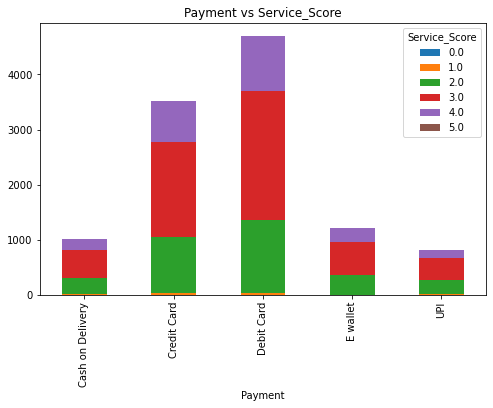

In [248]:
pd.crosstab(df['Payment'],df['Service_Score']).plot(kind='bar',stacked=True,figsize=(8,5));
plt.title('Payment vs Service_Score');

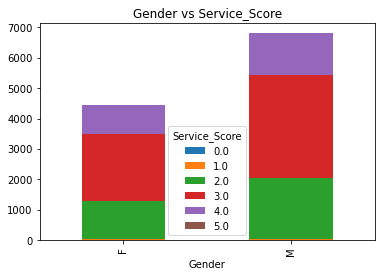

In [249]:
pd.crosstab(df['Gender'],df['Service_Score']).plot(kind='bar',stacked=True);
plt.title('Gender vs Service_Score');

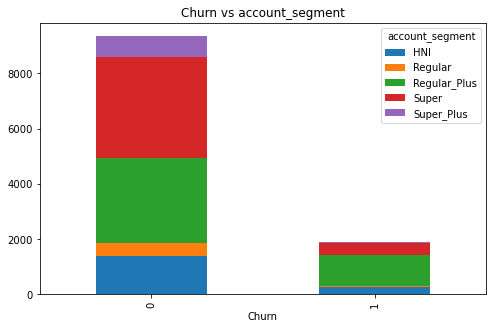

In [250]:
pd.crosstab(df['Churn'],df['account_segment']).plot(kind='bar',stacked=True,figsize=(8,5));
plt.title('Churn vs account_segment');

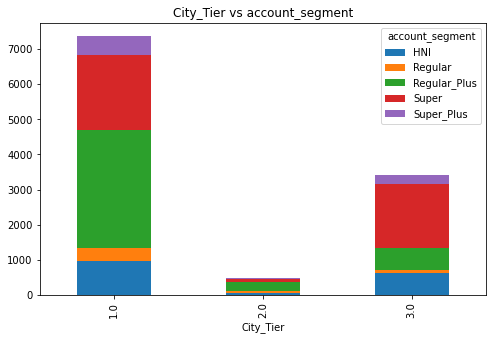

In [251]:
pd.crosstab(df['City_Tier'],df['account_segment']).plot(kind='bar',stacked=True,figsize=(8,5));
plt.title('City_Tier vs account_segment');

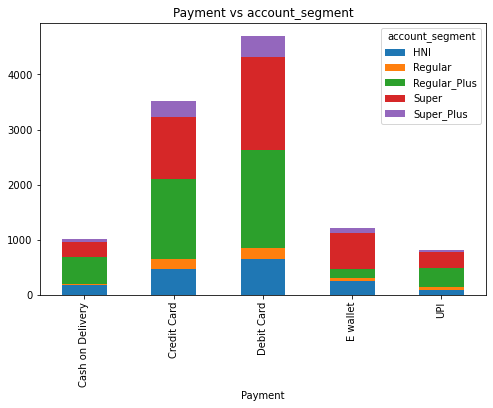

In [252]:
pd.crosstab(df['Payment'],df['account_segment']).plot(kind='bar',stacked=True,figsize=(8,5));
plt.title('Payment vs account_segment');

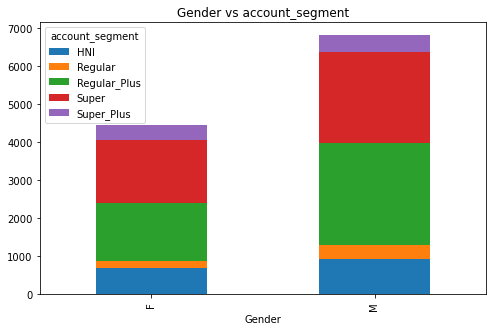

In [253]:
pd.crosstab(df['Gender'],df['account_segment']).plot(kind='bar',stacked=True,figsize=(8,5));
plt.title('Gender vs account_segment');

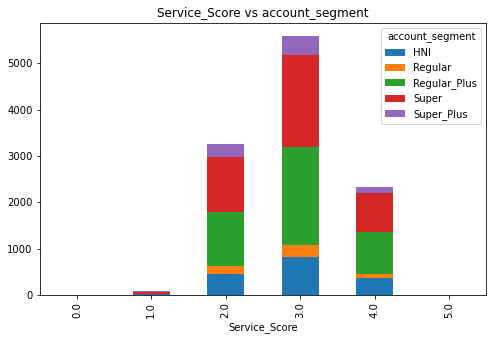

In [254]:
pd.crosstab(df['Service_Score'],df['account_segment']).plot(kind='bar',stacked=True,figsize=(8,5));
plt.title('Service_Score vs account_segment');

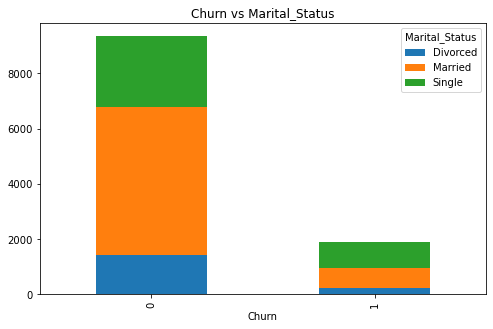

In [255]:
pd.crosstab(df['Churn'],df['Marital_Status']).plot(kind='bar',stacked=True,figsize=(8,5));
plt.title('Churn vs Marital_Status');

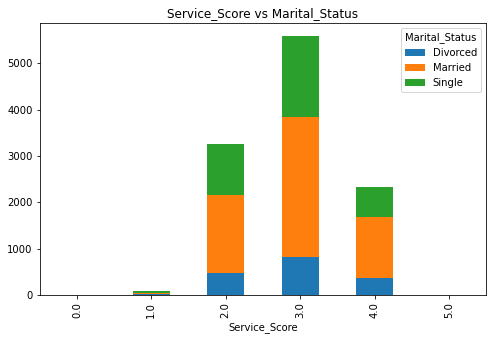

In [256]:
pd.crosstab(df['Service_Score'],df['Marital_Status']).plot(kind='bar',stacked=True,figsize=(8,5));
plt.title('Service_Score vs Marital_Status');

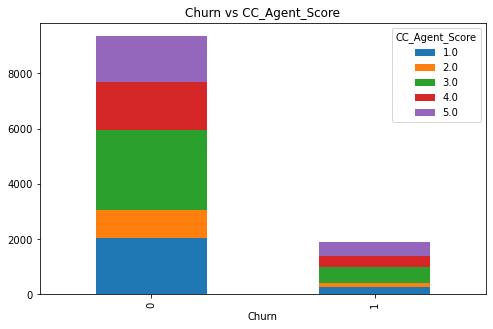

In [257]:
pd.crosstab(df['Churn'],df['CC_Agent_Score']).plot(kind='bar',stacked=True,figsize=(8,5));
plt.title('Churn vs CC_Agent_Score');

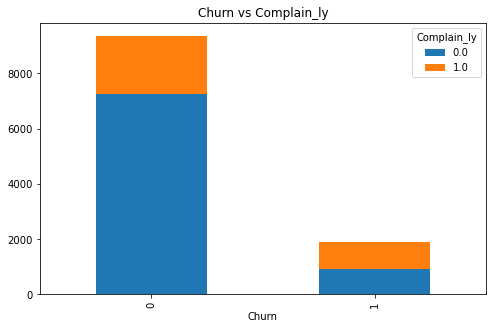

In [258]:
pd.crosstab(df['Churn'],df['Complain_ly']).plot(kind='bar',stacked=True,figsize=(8,5));
plt.title('Churn vs Complain_ly');

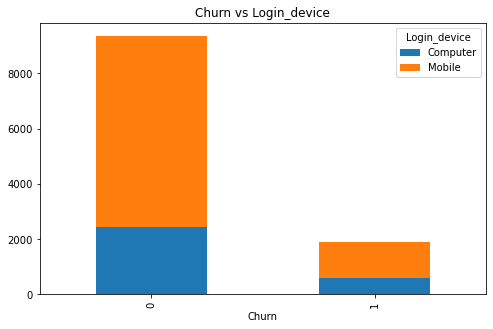

In [259]:
pd.crosstab(df['Churn'],df['Login_device']).plot(kind='bar',stacked=True,figsize=(8,5));
plt.title('Churn vs Login_device');

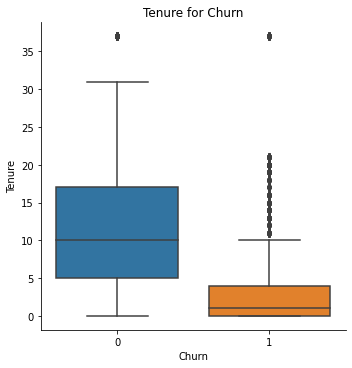

In [260]:
sns.catplot(x='Churn',y='Tenure',data=df,kind='box');
plt.title('Tenure for Churn');

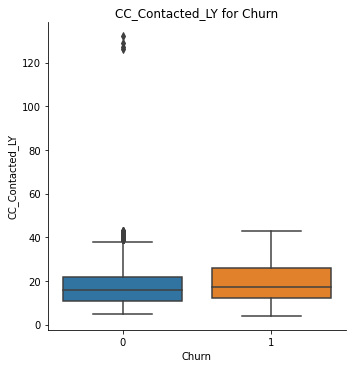

In [261]:
sns.catplot(x='Churn',y='CC_Contacted_LY',data=df,kind='box');
plt.title('CC_Contacted_LY for Churn');

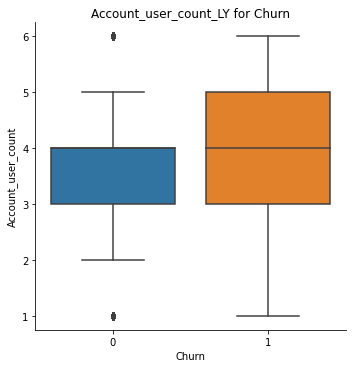

In [262]:
sns.catplot(x='Churn',y='Account_user_count',data=df,kind='box');
plt.title('Account_user_count_LY for Churn');

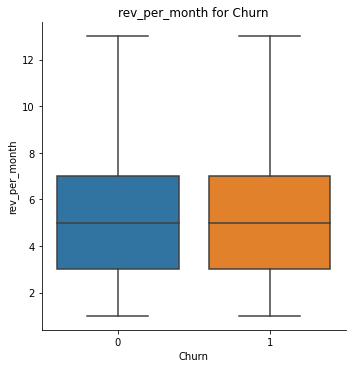

In [263]:
sns.catplot(x='Churn',y='rev_per_month',data=df,kind='box');
plt.title('rev_per_month for Churn');

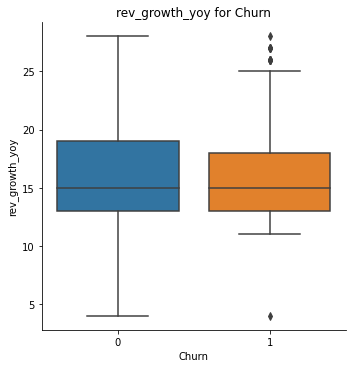

In [264]:
sns.catplot(x='Churn',y='rev_growth_yoy',data=df,kind='box');
plt.title('rev_growth_yoy for Churn');

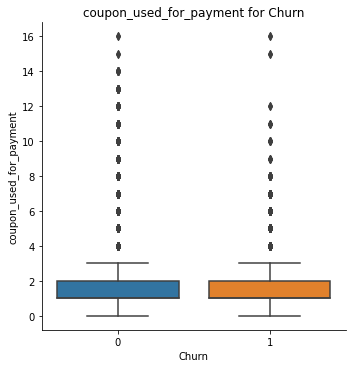

In [265]:
sns.catplot(x='Churn',y='coupon_used_for_payment',data=df,kind='box');
plt.title('coupon_used_for_payment for Churn');

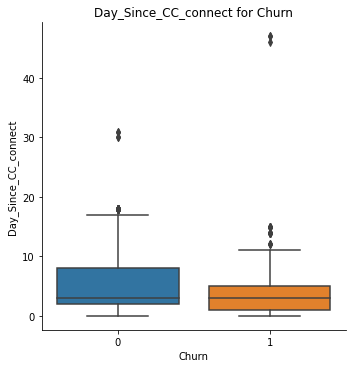

In [266]:
sns.catplot(x='Churn',y='Day_Since_CC_connect',data=df,kind='box');
plt.title('Day_Since_CC_connect for Churn');

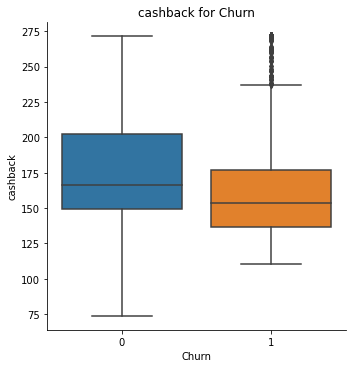

In [267]:
sns.catplot(x='Churn',y='cashback',data=df,kind='box');
plt.title('cashback for Churn');

### Encoding

In [268]:
cat = ['City_Tier', 'Payment', 'Marital_Status']

In [269]:
df =pd.get_dummies(df, columns=cat,drop_first=True)

In [270]:
df.head()

,AccountID,Churn,Tenure,CC_Contacted_LY,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,rev_per_month,...,cashback,Login_device,City_Tier_2.0,City_Tier_3.0,Payment_Credit Card,Payment_Debit Card,Payment_E wallet,Payment_UPI,Marital_Status_Married,Marital_Status_Single
0,20000,1,4.0,6.0,F,3.0,3.0,Super,2.0,9.0,...,159.93,Mobile,0,1,0,1,0,0,0,1
1,20001,1,0.0,8.0,M,3.0,4.0,Regular_Plus,3.0,7.0,...,120.90,Mobile,0,0,0,0,0,1,0,1
2,20002,1,0.0,30.0,M,2.0,4.0,Regular_Plus,3.0,6.0,...,165.25,Mobile,0,0,0,1,0,0,0,1
3,20003,1,0.0,15.0,M,2.0,4.0,Super,5.0,8.0,...,134.07,Mobile,0,1,0,1,0,0,0,1
4,20004,1,0.0,12.0,M,2.0,3.0,Regular_Plus,5.0,3.0,...,129.60,Mobile,0,0,1,0,0,0,0,1


In [271]:
df['Gender'] = np.where(df['Gender'] == 'F', 0, 1)
df['account_segment'] = np.where(df['account_segment'] == 'Regular', 0, df['account_segment'])
df['account_segment'] = np.where(df['account_segment'] == 'Regular_Plus', 1, df['account_segment'])
df['account_segment'] = np.where(df['account_segment'] == 'Super', 2, df['account_segment'])
df['account_segment'] = np.where(df['account_segment'] == 'Super_Plus', 3, df['account_segment'])
df['account_segment'] = np.where(df['account_segment'] == 'HNI', 4, df['account_segment'])
df['Login_device'] = np.where(df['Login_device'] == 'Computer', 0, 1)

In [272]:
df['Gender'].value_counts()

1    6812
0    4448
Name: Gender, dtype: int64

In [273]:
df['account_segment'].value_counts()

1    4221
2    4062
4    1639
3     818
0     520
Name: account_segment, dtype: int64

In [274]:
df['Login_device'].value_counts()

1    8242
0    3018
Name: Login_device, dtype: int64

In [275]:
df.shape

(11260, 24)

In [276]:
df.head()

,AccountID,Churn,Tenure,CC_Contacted_LY,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,rev_per_month,...,cashback,Login_device,City_Tier_2.0,City_Tier_3.0,Payment_Credit Card,Payment_Debit Card,Payment_E wallet,Payment_UPI,Marital_Status_Married,Marital_Status_Single
0,20000,1,4.0,6.0,0,3.0,3.0,2,2.0,9.0,...,159.93,1,0,1,0,1,0,0,0,1
1,20001,1,0.0,8.0,1,3.0,4.0,1,3.0,7.0,...,120.90,1,0,0,0,0,0,1,0,1
2,20002,1,0.0,30.0,1,2.0,4.0,1,3.0,6.0,...,165.25,1,0,0,0,1,0,0,0,1
3,20003,1,0.0,15.0,1,2.0,4.0,2,5.0,8.0,...,134.07,1,0,1,0,1,0,0,0,1
4,20004,1,0.0,12.0,1,2.0,3.0,1,5.0,3.0,...,129.60,1,0,0,1,0,0,0,0,1


In [277]:
df.drop('AccountID',axis=1,inplace=True)
df.shape

(11260, 23)

### Scaling

Let's create a copy of the dataset before scaling

In [278]:
df_new = df.copy()
df_new = df_new.drop('Churn',axis=1)

In [279]:
from sklearn.preprocessing import StandardScaler

In [280]:
SC = StandardScaler()
scaled_df = SC.fit_transform(df_new)
scaled_df

array([[-0.70331481, -1.3444021 , -1.2375277 , ..., -0.28062558,
        -1.08184713,  1.48285658],
       [-1.15333398, -1.11750219,  0.80806272, ...,  3.56346697,
        -1.08184713,  1.48285658],
       [-1.15333398,  1.37839678,  0.80806272, ..., -0.28062558,
        -1.08184713,  1.48285658],
       ...,
       [-1.04082919, -0.43680247,  0.80806272, ..., -0.28062558,
         0.92434501, -0.67437405],
       [ 1.43427623, -0.77715233,  0.80806272, ..., -0.28062558,
         0.92434501, -0.67437405],
       [-0.25329565,  0.47079715,  0.80806272, ..., -0.28062558,
         0.92434501, -0.67437405]])

In [281]:
scaled_df = pd.DataFrame(data=scaled_df, columns=df_new.columns, index=df_new.index)
scaled_df.head()

,Tenure,CC_Contacted_LY,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,rev_per_month,Complain_ly,rev_growth_yoy,...,cashback,Login_device,City_Tier_2.0,City_Tier_3.0,Payment_Credit Card,Payment_Debit Card,Payment_E wallet,Payment_UPI,Marital_Status_Married,Marital_Status_Single
0,-0.703315,-1.344402,-1.237528,0.133748,-0.701928,0.094301,-0.776488,1.302037,1.618461,-1.382201,...,-0.398295,0.605123,-0.211014,1.518849,-0.673120,1.182280,-0.348108,-0.280626,-1.081847,1.482857
1,-1.153334,-1.117502,0.808063,0.133748,0.293752,-0.817139,-0.047944,0.607469,1.618461,-0.317551,...,-1.294067,0.605123,-0.211014,-0.658393,-0.673120,-0.845824,-0.348108,3.563467,-1.081847,1.482857
2,-1.153334,1.378397,0.808063,-1.250443,0.293752,-0.817139,-0.047944,0.260185,1.618461,-0.583714,...,-0.276197,0.605123,-0.211014,-0.658393,-0.673120,1.182280,-0.348108,-0.280626,-1.081847,1.482857
3,-1.153334,-0.323353,0.808063,-1.250443,0.293752,0.094301,1.409143,0.954753,-0.617871,1.811748,...,-0.991804,0.605123,-0.211014,1.518849,-0.673120,1.182280,-0.348108,-0.280626,-1.081847,1.482857
4,-1.153334,-0.663702,0.808063,-1.250443,-0.701928,-0.817139,1.409143,-0.781666,-0.617871,-1.382201,...,-1.094395,0.605123,-0.211014,-0.658393,1.485619,-0.845824,-0.348108,-0.280626,-1.081847,1.482857


Let's find the Within Sum of Squares (WSS) for 2 to 15 clusters

In [282]:
from sklearn.cluster import KMeans

In [283]:
a=[]
for i in range(1,15):
    KM = KMeans(n_clusters=i, random_state=1)
    KM.fit(scaled_df)
    a.append(KM.inertia_)

In [284]:
print(a)

[247720.00000000006, 229980.73763238668, 214996.05310874674, 204117.89613707838, 191970.4709501605, 184239.9397428305, 176772.8470924067, 172186.95016811864, 172048.97469521756, 164890.1043459498, 162230.03000735564, 160198.5882002271, 158598.38382956357, 156342.74855525183]


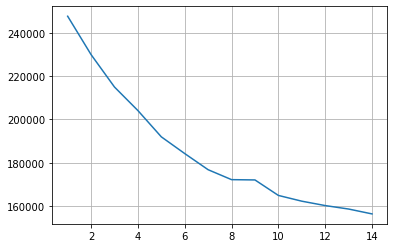

In [285]:
plt.plot(range(1,15),a)
plt.grid()
plt.show()

In [286]:
from sklearn.metrics import silhouette_samples, silhouette_score

In [287]:
ss = []
for k in range(2,11):
    sil_km = KMeans(n_clusters=k, random_state=1)
    sil_km.fit(scaled_df)
    labels = sil_km.labels_
    ss.append(silhouette_score(scaled_df,labels))

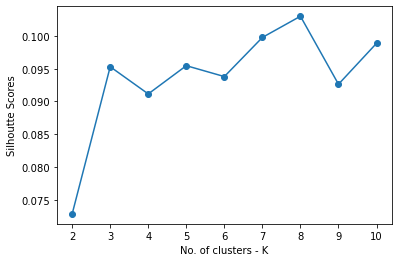

In [288]:
plt.plot(range(2,11),ss,marker ='o')
plt.xlabel('No. of clusters - K')
plt.ylabel('Silhoutte Scores');

In [289]:
k_means = KMeans(n_clusters=3, random_state=1)
k_means.fit(scaled_df)
labels = k_means.labels_

In [290]:
df["Clus_kmeans3"] = labels
df.head()

,Churn,Tenure,CC_Contacted_LY,Gender,Service_Score,Account_user_count,account_segment,CC_Agent_Score,rev_per_month,Complain_ly,...,Login_device,City_Tier_2.0,City_Tier_3.0,Payment_Credit Card,Payment_Debit Card,Payment_E wallet,Payment_UPI,Marital_Status_Married,Marital_Status_Single,Clus_kmeans3
0,1,4.0,6.0,0,3.0,3.0,2,2.0,9.0,1.0,...,1,0,1,0,1,0,0,0,1,2
1,1,0.0,8.0,1,3.0,4.0,1,3.0,7.0,1.0,...,1,0,0,0,0,0,1,0,1,1
2,1,0.0,30.0,1,2.0,4.0,1,3.0,6.0,1.0,...,1,0,0,0,1,0,0,0,1,2
3,1,0.0,15.0,1,2.0,4.0,2,5.0,8.0,0.0,...,1,0,1,0,1,0,0,0,1,2
4,1,0.0,12.0,1,2.0,3.0,1,5.0,3.0,0.0,...,1,0,0,1,0,0,0,0,1,1


In [291]:
df.Clus_kmeans3.value_counts().sort_index()

0    1217
1    5347
2    4696
Name: Clus_kmeans3, dtype: int64

In [292]:
clust_profile=df.drop(['Churn','Gender','Account_user_count','Login_device','City_Tier_2.0','City_Tier_3.0','Payment_Credit Card','Payment_Debit Card','Payment_E wallet','Payment_UPI','Marital_Status_Married','Marital_Status_Single'],axis=1)
clust_profile=clust_profile.groupby('Clus_kmeans3').mean()
clust_profile.round(0)

,Tenure,CC_Contacted_LY,rev_per_month,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback
Clus_kmeans3,,,,,,,
0,11.0,19.0,5.0,16.0,2.0,5.0,186.0
1,10.0,18.0,5.0,16.0,2.0,4.0,176.0
2,10.0,18.0,5.0,16.0,2.0,5.0,177.0


In [293]:
clust_profile['freq']=df.Clus_kmeans3.value_counts().sort_index()
clust_profile.round(0)

,Tenure,CC_Contacted_LY,rev_per_month,rev_growth_yoy,coupon_used_for_payment,Day_Since_CC_connect,cashback,freq
Clus_kmeans3,,,,,,,,
0,11.0,19.0,5.0,16.0,2.0,5.0,186.0,1217
1,10.0,18.0,5.0,16.0,2.0,4.0,176.0,5347
2,10.0,18.0,5.0,16.0,2.0,5.0,177.0,4696


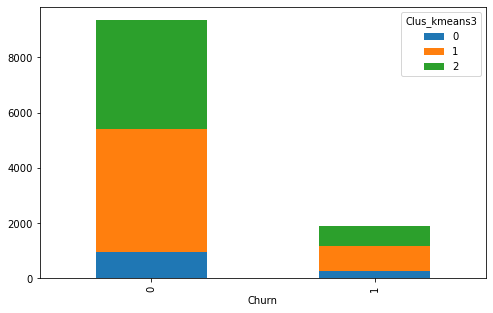

In [294]:
pd.crosstab(df['Churn'],df['Clus_kmeans3']).plot(kind='bar',stacked=True,figsize=(8,5));

## Model Building

### 1- Decision Tree

In [295]:
X = df.drop('Churn',axis=1)
y = df['Churn']

Splitting the dataset into training and test set

In [296]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.30, random_state=1)

In [297]:
from sklearn.tree import DecisionTreeClassifier

In [298]:
dt_model = DecisionTreeClassifier()

In [299]:
dt_model.fit(X_train, y_train)

DecisionTreeClassifier()

In [300]:
d_train_predict = dt_model.predict(X_train)
d_test_predict = dt_model.predict(X_test)

In [301]:
from sklearn.metrics import classification_report, plot_confusion_matrix, plot_roc_curve

In [302]:
print(classification_report(y_train,d_train_predict))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      6556
           1       1.00      1.00      1.00      1326

    accuracy                           1.00      7882
   macro avg       1.00      1.00      1.00      7882
weighted avg       1.00      1.00      1.00      7882



In [303]:
print(classification_report(y_test,d_test_predict))

              precision    recall  f1-score   support

           0       0.96      0.97      0.96      2808
           1       0.83      0.82      0.83       570

    accuracy                           0.94      3378
   macro avg       0.90      0.89      0.90      3378
weighted avg       0.94      0.94      0.94      3378



In [304]:
pd.DataFrame(dt_model.feature_importances_, 
             columns = ["Imp"], 
             index = X_train.columns).sort_values('Imp',ascending=False)

,Imp
Tenure,0.302391
CC_Agent_Score,0.071972
Day_Since_CC_connect,0.066270
cashback,0.060467
Complain_ly,0.059707
CC_Contacted_LY,0.053357
rev_per_month,0.052138
rev_growth_yoy,0.051455
account_segment,0.040501
Marital_Status_Single,0.034065


The model is overfit so let's tune the hyperparameters by using gridsearchcv

In [305]:
from sklearn.model_selection import GridSearchCV

In [306]:
param_grid = {
    'max_depth': [5, 6, 7, 8, 9, 10],
    'min_samples_leaf': [20, 30, 50, 100, 150],
    'min_samples_split': [60, 90, 150, 300, 450]
}

dt_model = DecisionTreeClassifier()

grid_search = GridSearchCV(estimator = dt_model, param_grid = param_grid, cv = 5)

In [307]:
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'max_depth': [5, 6, 7, 8, 9, 10],
                         'min_samples_leaf': [20, 30, 50, 100, 150],
                         'min_samples_split': [60, 90, 150, 300, 450]})

In [308]:
grid_search.best_params_

{'max_depth': 8, 'min_samples_leaf': 20, 'min_samples_split': 60}

In [309]:
best_grid = grid_search.best_estimator_

In [310]:
ytrain_predict = best_grid.predict(X_train)
ytest_predict = best_grid.predict(X_test)

In [311]:
print(classification_report(y_train,ytrain_predict))

              precision    recall  f1-score   support

           0       0.94      0.96      0.95      6556
           1       0.76      0.67      0.72      1326

    accuracy                           0.91      7882
   macro avg       0.85      0.82      0.83      7882
weighted avg       0.91      0.91      0.91      7882



In [312]:
print(classification_report(y_test,ytest_predict))

              precision    recall  f1-score   support

           0       0.93      0.95      0.94      2808
           1       0.74      0.65      0.69       570

    accuracy                           0.90      3378
   macro avg       0.83      0.80      0.81      3378
weighted avg       0.90      0.90      0.90      3378



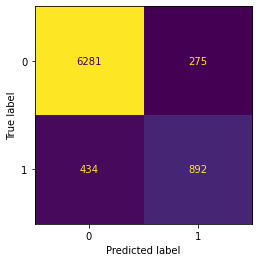

In [313]:
plot_confusion_matrix(best_grid,X_train,y_train,colorbar=False);

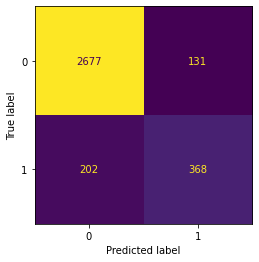

In [314]:
plot_confusion_matrix(best_grid,X_test,y_test,colorbar=False);

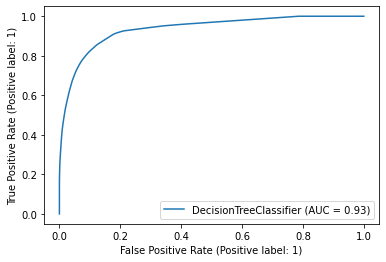

In [315]:
plot_roc_curve(best_grid,X_train,y_train);

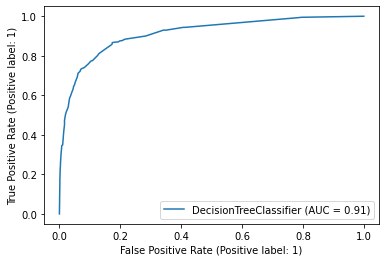

In [316]:
plot_roc_curve(best_grid,X_test,y_test);

In [317]:
best_grid.feature_importances_

array([0.50434698, 0.00799144, 0.        , 0.00170522, 0.0078161 ,
       0.0353657 , 0.06442559, 0.05374243, 0.11176959, 0.01218625,
       0.0036348 , 0.08535824, 0.00883768, 0.01430602, 0.        ,
       0.0236934 , 0.00976459, 0.        , 0.        , 0.        ,
       0.01061508, 0.02897525, 0.01546562])

In [318]:
pd.DataFrame(best_grid.feature_importances_, 
             columns = ["Imp"], 
             index = X_train.columns).sort_values('Imp',ascending=False)

,Imp
Tenure,0.504347
Complain_ly,0.111770
Day_Since_CC_connect,0.085358
CC_Agent_Score,0.064426
rev_per_month,0.053742
account_segment,0.035366
Marital_Status_Single,0.028975
City_Tier_3.0,0.023693
Clus_kmeans3,0.015466
Login_device,0.014306


### 2- Random Forest

In [319]:
from sklearn.ensemble import RandomForestClassifier

In [320]:
RF = RandomForestClassifier(random_state=1)

In [321]:
RF.fit(X_train, y_train)

RandomForestClassifier(random_state=1)

In [322]:
y_train_pred = RF.predict(X_train)
y_test_pred = RF.predict(X_test)

In [323]:
print(classification_report(y_train,y_train_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      6556
           1       1.00      1.00      1.00      1326

    accuracy                           1.00      7882
   macro avg       1.00      1.00      1.00      7882
weighted avg       1.00      1.00      1.00      7882



In [324]:
print(classification_report(y_test,y_test_pred))

              precision    recall  f1-score   support

           0       0.97      1.00      0.98      2808
           1       0.98      0.84      0.90       570

    accuracy                           0.97      3378
   macro avg       0.97      0.92      0.94      3378
weighted avg       0.97      0.97      0.97      3378



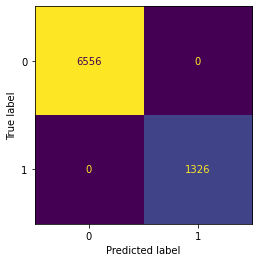

In [325]:
plot_confusion_matrix(RF,X_train,y_train,colorbar=False);

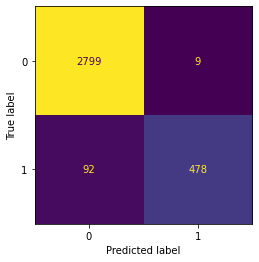

In [326]:
plot_confusion_matrix(RF,X_test,y_test,colorbar=False);

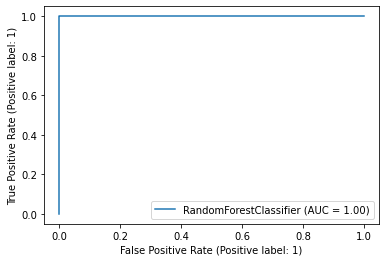

In [327]:
plot_roc_curve(RF,X_train,y_train);

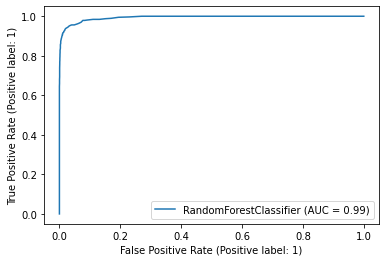

In [328]:
plot_roc_curve(RF,X_test,y_test);

In [329]:
pd.DataFrame(RF.feature_importances_, 
             columns = ["Imp"], 
             index = X_train.columns).sort_values('Imp',ascending=False)

,Imp
Tenure,0.226550
cashback,0.084497
CC_Contacted_LY,0.068814
Day_Since_CC_connect,0.068480
rev_growth_yoy,0.063268
Complain_ly,0.062800
rev_per_month,0.057803
CC_Agent_Score,0.052119
account_segment,0.042054
Account_user_count,0.037574


In [330]:
from sklearn.ensemble import RandomForestClassifier

In [331]:
param_grid = {
    'max_depth': [10, 11, 12],
    'max_features': [15, 18, 20],
    'min_samples_leaf': [20, 30, 50],
    'min_samples_split': [60, 100, 150],
    'n_estimators': [201]
}

rfcl = RandomForestClassifier()

grid_search = GridSearchCV(estimator = rfcl, param_grid = param_grid, cv = 3)

In [332]:
grid_search.fit(X_train, y_train)

GridSearchCV(cv=3, estimator=RandomForestClassifier(),
             param_grid={'max_depth': [10, 11, 12],
                         'max_features': [15, 18, 20],
                         'min_samples_leaf': [20, 30, 50],
                         'min_samples_split': [60, 100, 150],
                         'n_estimators': [201]})

In [333]:
grid_search.best_params_

{'max_depth': 12,
 'max_features': 20,
 'min_samples_leaf': 20,
 'min_samples_split': 60,
 'n_estimators': 201}

In [334]:
best_grid = grid_search.best_estimator_

In [335]:
ytrain_predict = best_grid.predict(X_train)
ytest_predict = best_grid.predict(X_test)

In [336]:
print(classification_report(y_train,ytrain_predict))

              precision    recall  f1-score   support

           0       0.93      0.97      0.95      6556
           1       0.83      0.64      0.73      1326

    accuracy                           0.92      7882
   macro avg       0.88      0.81      0.84      7882
weighted avg       0.91      0.92      0.91      7882



In [337]:
print(classification_report(y_test,ytest_predict))

              precision    recall  f1-score   support

           0       0.92      0.97      0.95      2808
           1       0.82      0.59      0.69       570

    accuracy                           0.91      3378
   macro avg       0.87      0.78      0.82      3378
weighted avg       0.90      0.91      0.90      3378



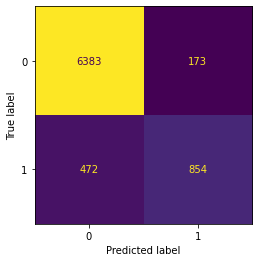

In [338]:
plot_confusion_matrix(best_grid,X_train,y_train,colorbar=False);

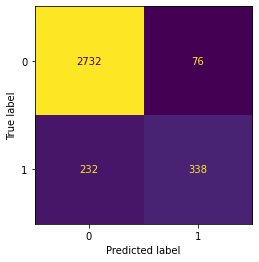

In [339]:
plot_confusion_matrix(best_grid,X_test,y_test,colorbar=False);

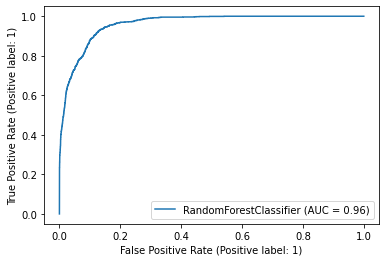

In [340]:
plot_roc_curve(best_grid,X_train,y_train);

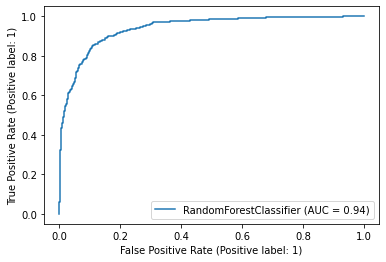

In [341]:
plot_roc_curve(best_grid,X_test,y_test);

In [342]:
pd.DataFrame(best_grid.feature_importances_, 
             columns = ["Imp"], 
             index = X_train.columns).sort_values('Imp',ascending=False)

,Imp
Tenure,0.502351
Complain_ly,0.114135
Day_Since_CC_connect,0.066536
CC_Agent_Score,0.054685
rev_per_month,0.054632
Marital_Status_Single,0.029411
CC_Contacted_LY,0.027814
account_segment,0.022516
City_Tier_3.0,0.020548
rev_growth_yoy,0.020443


### 3- Randome Forest using SMOTE

In [343]:
from imblearn.over_sampling import SMOTE

In [344]:
sm = SMOTE(random_state=2)

In [345]:
X_train_res, y_train_res = sm.fit_resample(X_train, y_train)

In [346]:
y_train.value_counts(1)

0    0.831769
1    0.168231
Name: Churn, dtype: float64

In [347]:
y_train_res.value_counts(1)

0    0.5
1    0.5
Name: Churn, dtype: float64

In [348]:
grid_search.fit(X_train_res, y_train_res)

GridSearchCV(cv=3, estimator=RandomForestClassifier(),
             param_grid={'max_depth': [10, 11, 12],
                         'max_features': [15, 18, 20],
                         'min_samples_leaf': [20, 30, 50],
                         'min_samples_split': [60, 100, 150],
                         'n_estimators': [201]})

In [349]:
grid_search.best_params_

{'max_depth': 12,
 'max_features': 15,
 'min_samples_leaf': 20,
 'min_samples_split': 60,
 'n_estimators': 201}

In [350]:
best_grid = grid_search.best_estimator_

In [351]:
ytrain_predict = best_grid.predict(X_train_res)
ytest_predict = best_grid.predict(X_test)

In [352]:
print(classification_report(y_train_res, ytrain_predict))

              precision    recall  f1-score   support

           0       0.93      0.95      0.94      6556
           1       0.95      0.93      0.94      6556

    accuracy                           0.94     13112
   macro avg       0.94      0.94      0.94     13112
weighted avg       0.94      0.94      0.94     13112



In [353]:
print(classification_report(y_test, ytest_predict))

              precision    recall  f1-score   support

           0       0.94      0.95      0.94      2808
           1       0.73      0.72      0.72       570

    accuracy                           0.91      3378
   macro avg       0.84      0.83      0.83      3378
weighted avg       0.91      0.91      0.91      3378



In [354]:
pd.DataFrame(best_grid.feature_importances_, 
             columns = ["Imp"], 
             index = X_train.columns).sort_values('Imp',ascending=False)

,Imp
Tenure,0.441582
Complain_ly,0.208191
Marital_Status_Married,0.060778
CC_Agent_Score,0.053444
rev_per_month,0.031125
account_segment,0.028361
Day_Since_CC_connect,0.024872
Payment_Credit Card,0.023125
CC_Contacted_LY,0.018402
rev_growth_yoy,0.014787


### 4- ANN

In [355]:
from sklearn.neural_network import MLPClassifier

In [356]:
X = df.drop('Churn',axis=1)
y = df['Churn']

In [357]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.30, random_state=1)

In [358]:
X_train = SC.fit_transform(X_train)

In [359]:
X_test = SC.transform(X_test)

In [360]:
clf = MLPClassifier(hidden_layer_sizes=100,
                    max_iter=5000,
                    solver='sgd',
                    verbose=True,  
                    random_state=1,
                    tol=0.01)

In [361]:
clf.fit(X_train, y_train)

Iteration 1, loss = 0.58342763
Iteration 2, loss = 0.48536489
Iteration 3, loss = 0.44919757
Iteration 4, loss = 0.43071902
Iteration 5, loss = 0.41784863
Iteration 6, loss = 0.40750849
Iteration 7, loss = 0.39868774
Iteration 8, loss = 0.39111117
Iteration 9, loss = 0.38444512
Iteration 10, loss = 0.37852251
Iteration 11, loss = 0.37326465
Iteration 12, loss = 0.36846124
Iteration 13, loss = 0.36412876
Iteration 14, loss = 0.36016803
Iteration 15, loss = 0.35654067
Iteration 16, loss = 0.35322781
Iteration 17, loss = 0.35014730
Training loss did not improve more than tol=0.010000 for 10 consecutive epochs. Stopping.


MLPClassifier(hidden_layer_sizes=100, max_iter=5000, random_state=1,
              solver='sgd', tol=0.01, verbose=True)

In [362]:
y_pred_train = clf.predict(X_train)
y_pred_test = clf.predict(X_test)

In [363]:
print(classification_report(y_train,y_pred_train))

              precision    recall  f1-score   support

           0       0.86      0.99      0.92      6556
           1       0.82      0.20      0.32      1326

    accuracy                           0.86      7882
   macro avg       0.84      0.60      0.62      7882
weighted avg       0.85      0.86      0.82      7882



In [364]:
print(classification_report(y_test,y_pred_test))

              precision    recall  f1-score   support

           0       0.86      0.99      0.92      2808
           1       0.76      0.20      0.32       570

    accuracy                           0.85      3378
   macro avg       0.81      0.60      0.62      3378
weighted avg       0.84      0.85      0.82      3378



Both recall and precision are very low, this is an underfit model

### 5- ANN using SMOTE

In [365]:
X_train_res, y_train_res = sm.fit_resample(X_train, y_train)

In [366]:
y_train_res.value_counts(1)

0    0.5
1    0.5
Name: Churn, dtype: float64

In [367]:
clf.fit(X_train_res, y_train_res)

Iteration 1, loss = 0.66959345
Iteration 2, loss = 0.60881132
Iteration 3, loss = 0.57162084
Iteration 4, loss = 0.54520554
Iteration 5, loss = 0.52529092
Iteration 6, loss = 0.50967513
Iteration 7, loss = 0.49709032
Iteration 8, loss = 0.48654901
Iteration 9, loss = 0.47769390
Iteration 10, loss = 0.47003611
Iteration 11, loss = 0.46340821
Iteration 12, loss = 0.45762298
Iteration 13, loss = 0.45243646
Iteration 14, loss = 0.44782204
Iteration 15, loss = 0.44365155
Iteration 16, loss = 0.43986706
Iteration 17, loss = 0.43640513
Iteration 18, loss = 0.43320481
Iteration 19, loss = 0.43026236
Training loss did not improve more than tol=0.010000 for 10 consecutive epochs. Stopping.


MLPClassifier(hidden_layer_sizes=100, max_iter=5000, random_state=1,
              solver='sgd', tol=0.01, verbose=True)

In [368]:
y_pred_train = clf.predict(X_train_res)
y_pred_test = clf.predict(X_test)

In [369]:
print(classification_report(y_train_res,y_pred_train))

              precision    recall  f1-score   support

           0       0.82      0.80      0.81      6556
           1       0.80      0.82      0.81      6556

    accuracy                           0.81     13112
   macro avg       0.81      0.81      0.81     13112
weighted avg       0.81      0.81      0.81     13112



In [370]:
print(classification_report(y_test,y_pred_test))

              precision    recall  f1-score   support

           0       0.95      0.79      0.86      2808
           1       0.44      0.78      0.56       570

    accuracy                           0.79      3378
   macro avg       0.69      0.79      0.71      3378
weighted avg       0.86      0.79      0.81      3378



### 6- ANN using gridsearchcv

In [371]:
param_grid = {
    'hidden_layer_sizes': [100,200,300], #[100,(100,200,150)]
    'max_iter': [5000, 2500],
    'solver': ['sgd','adam'],
    'tol': [0.01]
}

nncl = MLPClassifier(random_state=1)

grid_search = GridSearchCV(estimator = nncl, 
                           param_grid = param_grid, cv = 3,
                           scoring='recall'
                          )

In [372]:
grid_search.fit(X_train_res, y_train_res)

GridSearchCV(cv=3, estimator=MLPClassifier(random_state=1),
             param_grid={'hidden_layer_sizes': [100, 200, 300],
                         'max_iter': [5000, 2500], 'solver': ['sgd', 'adam'],
                         'tol': [0.01]},
             scoring='recall')

In [373]:
best_grid = grid_search.best_estimator_

In [374]:
y_pred_train = best_grid.predict(X_train_res)
y_pred_test = best_grid.predict(X_test)

In [375]:
print(classification_report(y_train_res,y_pred_train))

              precision    recall  f1-score   support

           0       0.99      0.95      0.97      6556
           1       0.96      0.99      0.97      6556

    accuracy                           0.97     13112
   macro avg       0.97      0.97      0.97     13112
weighted avg       0.97      0.97      0.97     13112



In [376]:
print(classification_report(y_test,y_pred_test))

              precision    recall  f1-score   support

           0       0.98      0.94      0.96      2808
           1       0.75      0.91      0.82       570

    accuracy                           0.93      3378
   macro avg       0.86      0.92      0.89      3378
weighted avg       0.94      0.93      0.94      3378



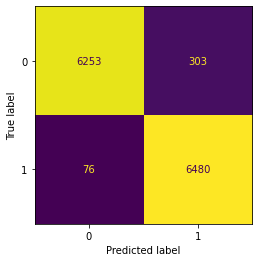

In [377]:
plot_confusion_matrix(best_grid,X_train_res,y_train_res,colorbar=False);

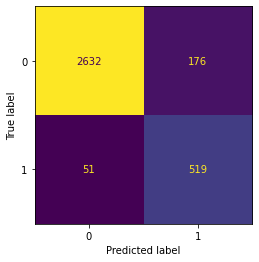

In [378]:
plot_confusion_matrix(best_grid,X_test,y_test,colorbar=False);

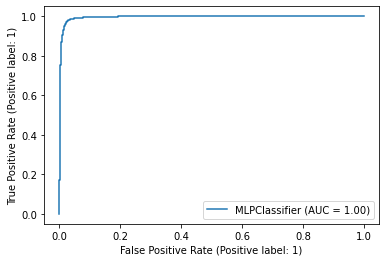

In [379]:
plot_roc_curve(best_grid,X_train_res,y_train_res);

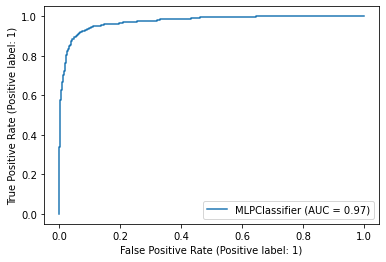

In [380]:
plot_roc_curve(best_grid,X_test,y_test);

### 7- Decision tree using SMOTE

In [381]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.30, random_state=1)

In [382]:
X_train_res, y_train_res = sm.fit_resample(X_train, y_train)

In [383]:
param_grid = {
    'max_depth': [5, 6, 7, 8, 9, 10],
    'min_samples_leaf': [20, 30, 50, 100, 150],
    'min_samples_split': [60, 90, 150, 300, 450]
}

dt_model = DecisionTreeClassifier()

grid_search = GridSearchCV(estimator = dt_model, param_grid = param_grid, cv = 5)

In [384]:
grid_search.fit(X_train_res, y_train_res)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'max_depth': [5, 6, 7, 8, 9, 10],
                         'min_samples_leaf': [20, 30, 50, 100, 150],
                         'min_samples_split': [60, 90, 150, 300, 450]})

In [385]:
grid_search.best_params_

{'max_depth': 10, 'min_samples_leaf': 20, 'min_samples_split': 60}

In [386]:
best_grid = grid_search.best_estimator_

In [387]:
ytrain_pred = best_grid.predict(X_train_res)
ytest_pred = best_grid.predict(X_test)

In [388]:
print(classification_report(y_train_res,ytrain_pred))

              precision    recall  f1-score   support

           0       0.91      0.93      0.92      6556
           1       0.93      0.91      0.92      6556

    accuracy                           0.92     13112
   macro avg       0.92      0.92      0.92     13112
weighted avg       0.92      0.92      0.92     13112



In [389]:
print(classification_report(y_test,ytest_pred))

              precision    recall  f1-score   support

           0       0.94      0.92      0.93      2808
           1       0.65      0.70      0.68       570

    accuracy                           0.89      3378
   macro avg       0.79      0.81      0.80      3378
weighted avg       0.89      0.89      0.89      3378



In [390]:
pd.DataFrame(best_grid.feature_importances_, 
             columns = ["Imp"], 
             index = X_train.columns).sort_values('Imp',ascending=False)

,Imp
Tenure,0.460577
Complain_ly,0.198016
CC_Agent_Score,0.056852
Marital_Status_Married,0.044186
Payment_Credit Card,0.029630
account_segment,0.028758
rev_per_month,0.028589
Day_Since_CC_connect,0.020997
Payment_E wallet,0.020365
Account_user_count,0.018376


### 8- Naive Bayes

In [391]:
from sklearn.naive_bayes import GaussianNB

In [392]:
NB_model = GaussianNB()
NB_model.fit(X_train, y_train)

GaussianNB()

In [393]:
ytrain_pred = NB_model.predict(X_train)
ytest_pred = NB_model.predict(X_test)

In [394]:
print(classification_report(y_train,ytrain_pred))

              precision    recall  f1-score   support

           0       0.91      0.91      0.91      6556
           1       0.55      0.54      0.55      1326

    accuracy                           0.85      7882
   macro avg       0.73      0.73      0.73      7882
weighted avg       0.85      0.85      0.85      7882



In [395]:
print(classification_report(y_test,ytest_pred))

              precision    recall  f1-score   support

           0       0.90      0.91      0.91      2808
           1       0.55      0.52      0.53       570

    accuracy                           0.85      3378
   macro avg       0.72      0.71      0.72      3378
weighted avg       0.84      0.85      0.84      3378



Both training and test set are performing poorly so this is clearly an underfit model

### 9- Naive Bayes using SMOTE

In [396]:
NB_model = GaussianNB()
NB_model.fit(X_train_res, y_train_res)

GaussianNB()

In [397]:
ytrain_pred = NB_model.predict(X_train_res)
ytest_pred = NB_model.predict(X_test)

In [398]:
print(classification_report(y_train_res,ytrain_pred))

              precision    recall  f1-score   support

           0       0.78      0.75      0.76      6556
           1       0.76      0.78      0.77      6556

    accuracy                           0.77     13112
   macro avg       0.77      0.77      0.77     13112
weighted avg       0.77      0.77      0.77     13112



In [399]:
print(classification_report(y_test,ytest_pred))

              precision    recall  f1-score   support

           0       0.91      0.75      0.82      2808
           1       0.34      0.65      0.45       570

    accuracy                           0.73      3378
   macro avg       0.63      0.70      0.63      3378
weighted avg       0.82      0.73      0.76      3378



Training set performed better but not the test set. This is an overfit model.

### 10- KNN

In [400]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [401]:
from sklearn.neighbors import KNeighborsClassifier

Best Value of K
<br>Run the KNN with no of neighbours to be 1,3,5..19 and *Find the optimal number of neighbours from K=1,3,5,7....19 using the Mis classification error

Hint: Misclassification error (MCE) = 1 - Test accuracy score. Calculated MCE for each model with neighbours = 1,3,5...19 and find the model with lowest MCE

In [402]:
# empty list that will hold accuracy scores
ac_scores = []

# perform accuracy metrics for values from 1,3,5....19
for k in range(1,20,2):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    # evaluate test accuracy
    scores = knn.score(X_test, y_test)
    ac_scores.append(scores)

# changing to misclassification error
MCE = [1 - x for x in ac_scores] # this technique is called list comprehension
MCE

[0.02072232089994075,
 0.030491415038484293,
 0.03197158081705154,
 0.04026050917702784,
 0.06305506216696266,
 0.0793368857312019,
 0.09265837773830665,
 0.10035523978685612,
 0.10805210183540559,
 0.11249259917110721]

Plot misclassification error vs k (with k value on X-axis) using matplotlib

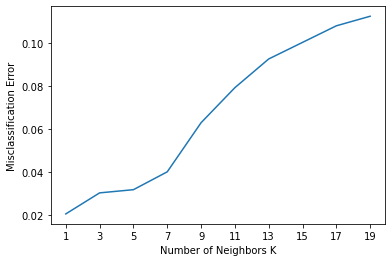

In [403]:
# plot misclassification error vs k
plt.plot(range(1,20,2), MCE)
plt.xlabel('Number of Neighbors K')
plt.ylabel('Misclassification Error')
plt.xticks(range(1,20,2));

MCE is lowest for k=3

In [404]:
KNN_model=KNeighborsClassifier(n_neighbors=3)
KNN_model.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=3)

In [405]:
y_train_predict = KNN_model.predict(X_train)
y_test_predict = KNN_model.predict(X_test)

In [406]:
print(classification_report(y_train,y_train_predict))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      6556
           1       0.98      0.95      0.97      1326

    accuracy                           0.99      7882
   macro avg       0.98      0.97      0.98      7882
weighted avg       0.99      0.99      0.99      7882



In [407]:
print(classification_report(y_test,y_test_predict))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98      2808
           1       0.93      0.88      0.91       570

    accuracy                           0.97      3378
   macro avg       0.95      0.93      0.94      3378
weighted avg       0.97      0.97      0.97      3378



### 11- KNN using SMOTE

In [408]:
X_train_res, y_train_res = sm.fit_resample(X_train, y_train)

In [409]:
KNN_model.fit(X_train_res,y_train_res)

KNeighborsClassifier(n_neighbors=3)

In [410]:
y_train_predict = KNN_model.predict(X_train_res)
y_test_predict = KNN_model.predict(X_test)

In [411]:
print(classification_report(y_train_res,y_train_predict))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      6556
           1       0.99      1.00      0.99      6556

    accuracy                           0.99     13112
   macro avg       0.99      0.99      0.99     13112
weighted avg       0.99      0.99      0.99     13112



In [412]:
print(classification_report(y_test,y_test_predict))

              precision    recall  f1-score   support

           0       0.99      0.97      0.98      2808
           1       0.86      0.96      0.91       570

    accuracy                           0.97      3378
   macro avg       0.93      0.96      0.94      3378
weighted avg       0.97      0.97      0.97      3378



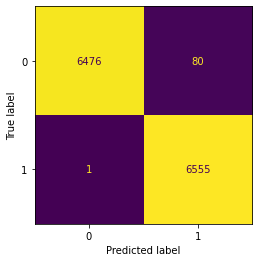

In [413]:
plot_confusion_matrix(KNN_model,X_train_res,y_train_res,colorbar=False);

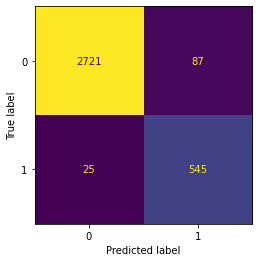

In [414]:
plot_confusion_matrix(KNN_model,X_test,y_test,colorbar=False);

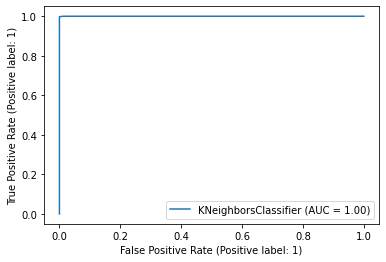

In [415]:
plot_roc_curve(KNN_model,X_train_res,y_train_res);

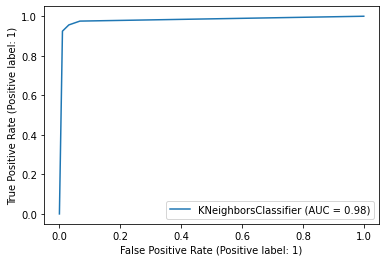

In [416]:
plot_roc_curve(KNN_model,X_test,y_test);

### 12- Bagging classifier

In [417]:
X = df.drop('Churn',axis=1)
y = df['Churn']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.30, random_state=1)

In [418]:
from sklearn.ensemble import BaggingClassifier

In [419]:
RF = RandomForestClassifier()
Bagging_model=BaggingClassifier(base_estimator=RF,
                                n_estimators=100,
                                random_state=1)
Bagging_model.fit(X_train, y_train)

BaggingClassifier(base_estimator=RandomForestClassifier(), n_estimators=100,
                  random_state=1)

In [420]:
y_pred_train = Bagging_model.predict(X_train)
y_pred_test = Bagging_model.predict(X_test)

In [421]:
print(classification_report(y_train, y_pred_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      6556
           1       1.00      0.98      0.99      1326

    accuracy                           1.00      7882
   macro avg       1.00      0.99      0.99      7882
weighted avg       1.00      1.00      1.00      7882



In [422]:
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.95      1.00      0.98      2808
           1       0.98      0.76      0.86       570

    accuracy                           0.96      3378
   macro avg       0.97      0.88      0.92      3378
weighted avg       0.96      0.96      0.96      3378



Recall dropped drastically so this is an overfit model

### 13- Bagging classifier using GridsearchCV

In [424]:
grid = {"base_estimator__max_depth": [3,6,10],
          "base_estimator__max_features": [None, "auto"],
          "base_estimator__min_samples_leaf": [30, 50, 70],
          "base_estimator__min_samples_split": [100, 150, 200],
          'bootstrap_features': [False, True],
          'max_features': [0.5, 0.7, 1.0],
          'max_samples': [0.5, 0.7, 1.0],
          'n_estimators': [50, 70]
}

In [425]:
gridsearch = GridSearchCV(BaggingClassifier(DecisionTreeClassifier(random_state=1)), grid, cv=3, verbose=1,n_jobs=-1)

In [426]:
gridsearch.fit(X_train,y_train)

Fitting 3 folds for each of 1944 candidates, totalling 5832 fits


GridSearchCV(cv=3,
             estimator=BaggingClassifier(base_estimator=DecisionTreeClassifier(random_state=1)),
             n_jobs=-1,
             param_grid={'base_estimator__max_depth': [3, 6, 10],
                         'base_estimator__max_features': [None, 'auto'],
                         'base_estimator__min_samples_leaf': [30, 50, 70],
                         'base_estimator__min_samples_split': [100, 150, 200],
                         'bootstrap_features': [False, True],
                         'max_features': [0.5, 0.7, 1.0],
                         'max_samples': [0.5, 0.7, 1.0],
                         'n_estimators': [50, 70]},
             verbose=1)

In [427]:
gridsearch.best_params_

{'base_estimator__max_depth': 10,
 'base_estimator__max_features': None,
 'base_estimator__min_samples_leaf': 30,
 'base_estimator__min_samples_split': 100,
 'bootstrap_features': False,
 'max_features': 0.7,
 'max_samples': 1.0,
 'n_estimators': 50}

In [428]:
best_model = gridsearch.best_estimator_

In [429]:
y_pred_train = best_model.predict(X_train)
y_pred_test = best_model.predict(X_test)

In [430]:
print(classification_report(y_train, y_pred_train))

              precision    recall  f1-score   support

           0       0.91      0.98      0.94      6556
           1       0.86      0.51      0.64      1326

    accuracy                           0.90      7882
   macro avg       0.89      0.75      0.79      7882
weighted avg       0.90      0.90      0.89      7882



In [431]:
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.90      0.99      0.94      2808
           1       0.87      0.48      0.62       570

    accuracy                           0.90      3378
   macro avg       0.89      0.73      0.78      3378
weighted avg       0.90      0.90      0.89      3378



### 14- Bagging classifier using SMOTE

In [433]:
X_train_res, y_train_res = sm.fit_resample(X_train, y_train)

In [434]:
best_model.fit(X_train_res, y_train_res)

BaggingClassifier(base_estimator=DecisionTreeClassifier(max_depth=10,
                                                        min_samples_leaf=30,
                                                        min_samples_split=100,
                                                        random_state=1),
                  max_features=0.7, n_estimators=50)

In [435]:
y_pred_train = best_model.predict(X_train_res)
y_pred_test = best_model.predict(X_test)

In [436]:
print(classification_report(y_train_res, y_pred_train))

              precision    recall  f1-score   support

           0       0.93      0.95      0.94      6556
           1       0.95      0.93      0.94      6556

    accuracy                           0.94     13112
   macro avg       0.94      0.94      0.94     13112
weighted avg       0.94      0.94      0.94     13112



In [437]:
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.94      0.95      0.95      2808
           1       0.74      0.70      0.72       570

    accuracy                           0.91      3378
   macro avg       0.84      0.83      0.83      3378
weighted avg       0.91      0.91      0.91      3378



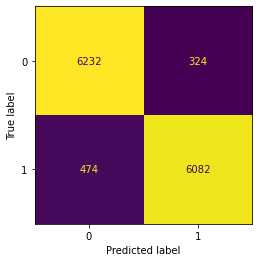

In [438]:
plot_confusion_matrix(best_model,X_train_res,y_train_res,colorbar=False);

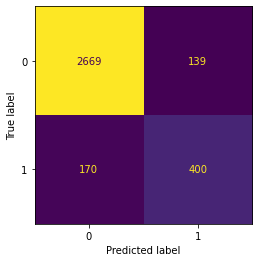

In [439]:
plot_confusion_matrix(best_model,X_test,y_test,colorbar=False);

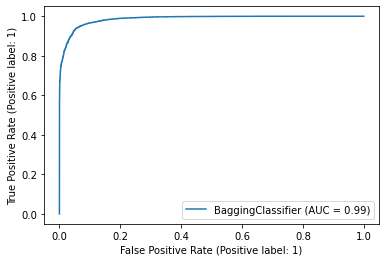

In [440]:
plot_roc_curve(best_model,X_train_res,y_train_res);

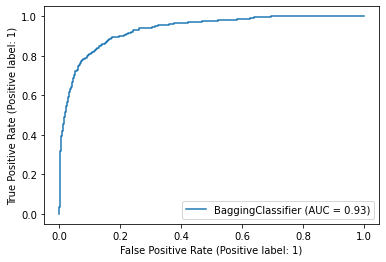

In [441]:
plot_roc_curve(best_model,X_test,y_test);

Still it is an overfit model

### 15 -  Ada Boost

In [443]:
from sklearn.ensemble import AdaBoostClassifier

In [444]:
ADB_model = AdaBoostClassifier(n_estimators=100,random_state=1)
ADB_model.fit(X_train,y_train)

AdaBoostClassifier(n_estimators=100, random_state=1)

In [445]:
ADB_train_pred = ADB_model.predict(X_train)
ADB_test_pred = ADB_model.predict(X_test)

In [446]:
#classification report of training set
print(classification_report(y_train,ADB_train_pred))

              precision    recall  f1-score   support

           0       0.92      0.96      0.94      6556
           1       0.76      0.60      0.67      1326

    accuracy                           0.90      7882
   macro avg       0.84      0.78      0.81      7882
weighted avg       0.90      0.90      0.90      7882



In [447]:
#classification report of test set
print(classification_report(y_test,ADB_test_pred))

              precision    recall  f1-score   support

           0       0.92      0.96      0.94      2808
           1       0.76      0.59      0.66       570

    accuracy                           0.90      3378
   macro avg       0.84      0.78      0.80      3378
weighted avg       0.89      0.90      0.89      3378



In [448]:
pd.DataFrame(ADB_model.feature_importances_, 
             columns = ["Imp"], 
             index = X_train.columns).sort_values('Imp',ascending=False)

,Imp
Tenure,0.18
cashback,0.17
Day_Since_CC_connect,0.13
coupon_used_for_payment,0.07
rev_growth_yoy,0.06
account_segment,0.05
rev_per_month,0.05
Clus_kmeans3,0.03
CC_Contacted_LY,0.03
Account_user_count,0.03


### 16 - Ada Boost using GridsearchCV

In [449]:
abc_tuned = AdaBoostClassifier(random_state=1)

In [450]:
parameters = {
    #Let's try different max_depth for base_estimator
    "base_estimator":[DecisionTreeClassifier(max_depth=1),DecisionTreeClassifier(max_depth=2),DecisionTreeClassifier(max_depth=3),DecisionTreeClassifier(max_depth=4),DecisionTreeClassifier(max_depth=5),DecisionTreeClassifier(max_depth=6)],
    "n_estimators": np.arange(1,301,100),
    "learning_rate":np.arange(0.1,2,0.4)
}

In [451]:
grid_obj = GridSearchCV(abc_tuned, parameters, scoring='recall',cv=3,n_jobs=-1)
grid_obj = grid_obj.fit(X_train, y_train)

In [452]:
grid_obj.best_params_

{'base_estimator': DecisionTreeClassifier(max_depth=6),
 'learning_rate': 0.5,
 'n_estimators': 201}

In [453]:
best_model = grid_obj.best_estimator_

In [454]:
ABT_train_pred = best_model.predict(X_train)
ABT_test_pred = best_model.predict(X_test)

In [455]:
#classification report of training set
print(classification_report(y_train,ABT_train_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      6556
           1       1.00      1.00      1.00      1326

    accuracy                           1.00      7882
   macro avg       1.00      1.00      1.00      7882
weighted avg       1.00      1.00      1.00      7882



In [456]:
#classification report of test set
print(classification_report(y_test,ABT_test_pred))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      2808
           1       0.97      0.86      0.91       570

    accuracy                           0.97      3378
   macro avg       0.97      0.93      0.95      3378
weighted avg       0.97      0.97      0.97      3378



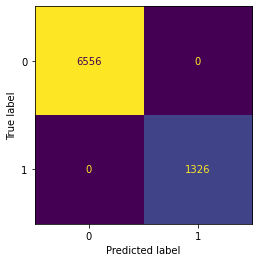

In [457]:
plot_confusion_matrix(best_model,X_train,y_train,colorbar=False);

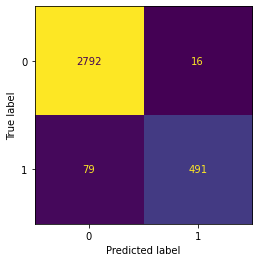

In [458]:
plot_confusion_matrix(best_model,X_test,y_test,colorbar=False);

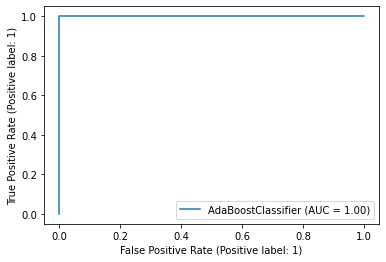

In [459]:
plot_roc_curve(best_model,X_train,y_train);

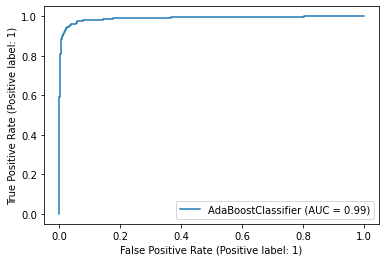

In [460]:
plot_roc_curve(best_model,X_test,y_test);

In [461]:
pd.DataFrame(best_model.feature_importances_, 
             columns = ["Imp"], 
             index = X_train.columns).sort_values('Imp',ascending=False)

,Imp
cashback,0.199096
CC_Contacted_LY,0.106947
rev_growth_yoy,0.090597
Tenure,0.081710
Day_Since_CC_connect,0.079526
CC_Agent_Score,0.066213
rev_per_month,0.059282
Account_user_count,0.044124
coupon_used_for_payment,0.031847
Login_device,0.030430


### 17- Gradient Boost

In [462]:
from sklearn.ensemble import GradientBoostingClassifier
gbc = GradientBoostingClassifier(random_state=1)

In [463]:
gbc = gbc.fit(X_train, y_train)

In [464]:
GB_train_pred = gbc.predict(X_train)
GB_test_pred = gbc.predict(X_test)

In [465]:
print(classification_report(y_train,GB_train_pred))

              precision    recall  f1-score   support

           0       0.93      0.97      0.95      6556
           1       0.83      0.65      0.73      1326

    accuracy                           0.92      7882
   macro avg       0.88      0.81      0.84      7882
weighted avg       0.92      0.92      0.92      7882



In [466]:
print(classification_report(y_test,GB_test_pred))

              precision    recall  f1-score   support

           0       0.93      0.98      0.95      2808
           1       0.84      0.61      0.71       570

    accuracy                           0.92      3378
   macro avg       0.88      0.80      0.83      3378
weighted avg       0.91      0.92      0.91      3378



In [467]:
pd.DataFrame(gbc.feature_importances_, 
             columns = ["Imp"], 
             index = X_train.columns).sort_values('Imp',ascending=False)

,Imp
Tenure,0.530062
Complain_ly,0.121920
Day_Since_CC_connect,0.061518
rev_per_month,0.044071
CC_Agent_Score,0.041504
Marital_Status_Single,0.031623
account_segment,0.031452
Account_user_count,0.022324
cashback,0.018081
CC_Contacted_LY,0.017703


### 18- Gradient Boost using GridSearchCV

In [468]:
gbc_tuned = GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),random_state=1)

In [469]:
parameters = {
    "n_estimators": [100,150,200,250],
    "subsample":[0.8,0.9,1],
    "max_features":[0.7,0.8,0.9,1]
}

In [470]:
grid_obj = GridSearchCV(gbc_tuned, parameters, scoring='recall',cv=5,n_jobs=-1)
grid_obj = grid_obj.fit(X_train, y_train)

In [471]:
grid_obj.best_params_

{'max_features': 0.8, 'n_estimators': 250, 'subsample': 0.9}

In [472]:
gbc_tuned = grid_obj.best_estimator_

In [473]:
GBT_train_pred = gbc_tuned.predict(X_train)
GBT_test_pred = gbc_tuned.predict(X_test)

In [474]:
print(classification_report(y_train,GBT_train_pred))

              precision    recall  f1-score   support

           0       0.95      0.98      0.96      6556
           1       0.89      0.73      0.80      1326

    accuracy                           0.94      7882
   macro avg       0.92      0.86      0.88      7882
weighted avg       0.94      0.94      0.94      7882



In [475]:
print(classification_report(y_test,GBT_test_pred))

              precision    recall  f1-score   support

           0       0.93      0.98      0.95      2808
           1       0.85      0.65      0.74       570

    accuracy                           0.92      3378
   macro avg       0.89      0.82      0.85      3378
weighted avg       0.92      0.92      0.92      3378



In [476]:
pd.DataFrame(gbc_tuned.feature_importances_, 
             columns = ["Imp"], 
             index = X_train.columns).sort_values('Imp',ascending=False)

,Imp
Tenure,0.455068
Complain_ly,0.110410
Day_Since_CC_connect,0.066947
CC_Agent_Score,0.048452
rev_per_month,0.046706
cashback,0.045739
account_segment,0.037662
Marital_Status_Single,0.031351
CC_Contacted_LY,0.026766
Account_user_count,0.025525


### 19- Gradient Boost using SMOTE

In [477]:
gbc_tuned = GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),random_state=1)

In [478]:
parameters = {
    "n_estimators": [100,150,200,250],
    "subsample":[0.8,0.9,1],
    "max_features":[0.7,0.8,0.9,1]
}

In [479]:
grid_obj = GridSearchCV(gbc_tuned, parameters, scoring='recall',cv=5,n_jobs=-1)
grid_obj = grid_obj.fit(X_train_res, y_train_res)

In [480]:
grid_obj.best_params_

{'max_features': 1, 'n_estimators': 250, 'subsample': 1}

In [481]:
gbc_tuned = grid_obj.best_estimator_

In [482]:
GBT_train_pred = gbc_tuned.predict(X_train_res)
GBT_test_pred = gbc_tuned.predict(X_test)

In [483]:
print(classification_report(y_train_res,GBT_train_pred))

              precision    recall  f1-score   support

           0       0.92      0.94      0.93      6556
           1       0.94      0.92      0.93      6556

    accuracy                           0.93     13112
   macro avg       0.93      0.93      0.93     13112
weighted avg       0.93      0.93      0.93     13112



In [484]:
print(classification_report(y_test,GBT_test_pred))

              precision    recall  f1-score   support

           0       0.94      0.94      0.94      2808
           1       0.71      0.71      0.71       570

    accuracy                           0.90      3378
   macro avg       0.83      0.83      0.83      3378
weighted avg       0.90      0.90      0.90      3378



This is an overfit model

In [485]:
pd.DataFrame(gbc_tuned.feature_importances_, 
             columns = ["Imp"], 
             index = X_train.columns).sort_values('Imp',ascending=False)

,Imp
Tenure,0.241843
Complain_ly,0.179765
Marital_Status_Married,0.088490
Day_Since_CC_connect,0.074211
account_segment,0.053083
Payment_Credit Card,0.047218
Account_user_count,0.034138
rev_per_month,0.032412
Payment_Debit Card,0.032371
CC_Agent_Score,0.030624


### 20- Logistic Regression

Logistic regression is impacted by outliers so we need to treat few more columns which we did not treater earlier

In [486]:
out = ['CC_Contacted_LY', 'coupon_used_for_payment', 'Day_Since_CC_connect']

In [487]:
for column in out:
    lr,ur=remove_outlier(df[column])
    df[column]=np.where(df[column]>ur,ur,df[column])
    df[column]=np.where(df[column]<lr,lr,df[column])

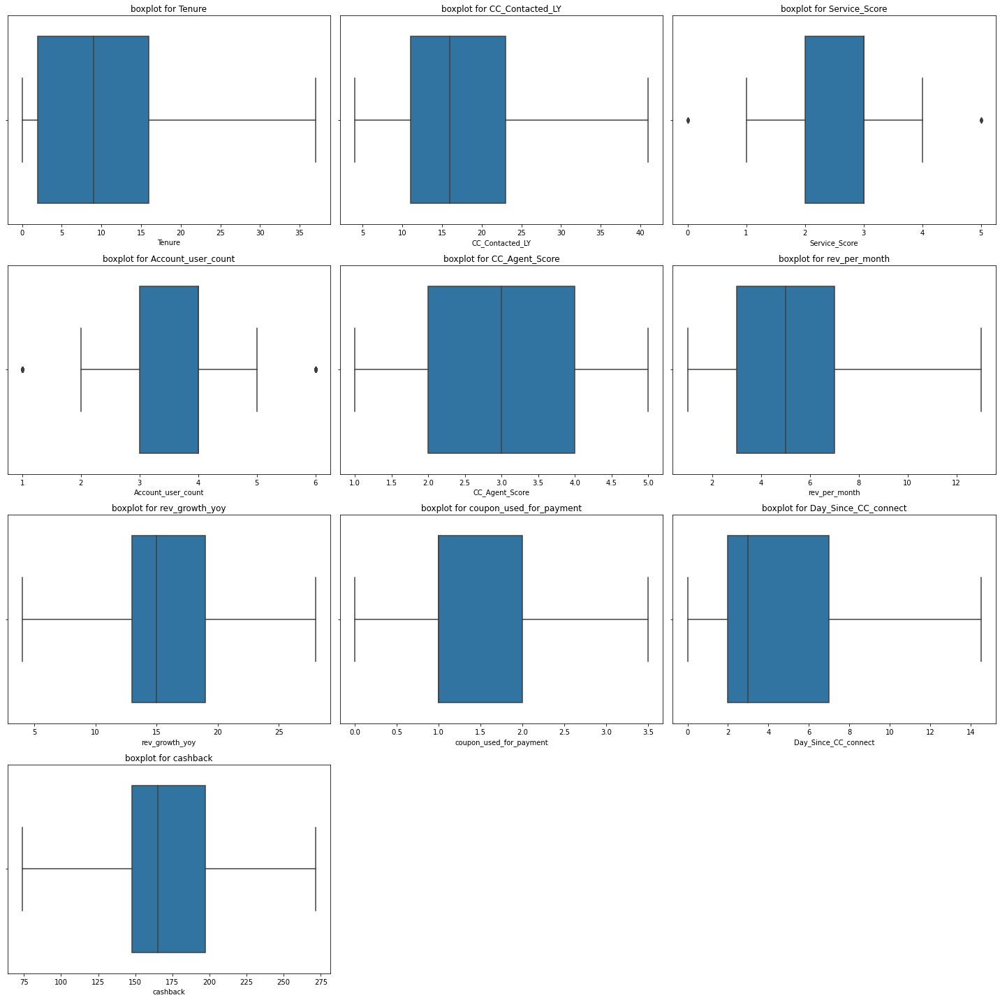

In [488]:
fig=plt.figure(figsize=(20,20))
for i in range(0,len(num_cols)):
    ax=fig.add_subplot(4,3,i+1)
    sns.boxplot(df[num_cols[i]])
    plt.title(f'boxplot for {num_cols[i]}')
    plt.tight_layout()

In [489]:
X = df.drop('Churn',axis=1)
y = df['Churn']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.30, random_state=1)

In [490]:
from sklearn.linear_model import LogisticRegression

In [491]:
Log_classifier = LogisticRegression(max_iter=101, random_state=1)

In [492]:
Log_classifier.fit(X_train,y_train)

LogisticRegression(max_iter=101, random_state=1)

In [493]:
y_pred_train_log = Log_classifier.predict(X_train)
y_pred_test_log = Log_classifier.predict(X_test)

In [494]:
print(classification_report(y_train, y_pred_train_log))

              precision    recall  f1-score   support

           0       0.89      0.97      0.93      6556
           1       0.72      0.42      0.53      1326

    accuracy                           0.88      7882
   macro avg       0.81      0.69      0.73      7882
weighted avg       0.86      0.88      0.86      7882



In [495]:
print(classification_report(y_test, y_pred_test_log))

              precision    recall  f1-score   support

           0       0.89      0.97      0.93      2808
           1       0.71      0.43      0.54       570

    accuracy                           0.87      3378
   macro avg       0.80      0.70      0.73      3378
weighted avg       0.86      0.87      0.86      3378



It is a fair model

### 21 - Logistic regression using GridSearchCV

In [496]:
grid={'penalty':['l2','none','l1','elasticnet'],
      'solver':['sag','lbfgs','saga','newton-cg','liblinear'],
      'tol':[0.0001, 0.1, 0.01,0.001],
     'l1_ratio':[0.25,0.5,0.75],
     'max_iter':[100,300,500]}

In [497]:
LR_G = LogisticRegression(random_state=1)

In [498]:
grid_search = GridSearchCV(estimator = LR_G, 
                           param_grid = grid, 
                           cv = 5,
                           n_jobs=-1,
                           scoring='recall')

In [499]:
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=LogisticRegression(random_state=1), n_jobs=-1,
             param_grid={'l1_ratio': [0.25, 0.5, 0.75],
                         'max_iter': [100, 300, 500],
                         'penalty': ['l2', 'none', 'l1', 'elasticnet'],
                         'solver': ['sag', 'lbfgs', 'saga', 'newton-cg',
                                    'liblinear'],
                         'tol': [0.0001, 0.1, 0.01, 0.001]},
             scoring='recall')

In [500]:
grid_search.best_params_

{'l1_ratio': 0.25,
 'max_iter': 500,
 'penalty': 'none',
 'solver': 'lbfgs',
 'tol': 0.0001}

In [501]:
best_model = grid_search.best_estimator_

In [502]:
ytrain_predict_lrg = best_model.predict(X_train)
ytest_predict_lrg = best_model.predict(X_test)

In [503]:
print(classification_report(y_train, ytrain_predict_lrg))

              precision    recall  f1-score   support

           0       0.90      0.97      0.93      6556
           1       0.75      0.46      0.57      1326

    accuracy                           0.88      7882
   macro avg       0.82      0.71      0.75      7882
weighted avg       0.87      0.88      0.87      7882



In [504]:
print(classification_report(y_test, ytest_predict_lrg))

              precision    recall  f1-score   support

           0       0.90      0.97      0.93      2808
           1       0.75      0.46      0.57       570

    accuracy                           0.88      3378
   macro avg       0.82      0.71      0.75      3378
weighted avg       0.87      0.88      0.87      3378



Still an underfit model

### 22 - Logistic regression using SMOTE

In [505]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=1)

X_train_res, y_train_res = sm.fit_resample(X_train, y_train)

In [506]:
y_train.value_counts()

0    6556
1    1326
Name: Churn, dtype: int64

In [507]:
y_train_res.value_counts()

0    6556
1    6556
Name: Churn, dtype: int64

In [508]:
Log_classifier_SM = LogisticRegression(max_iter=101, random_state=1)

In [509]:
Log_classifier_SM.fit(X_train_res,y_train_res)

LogisticRegression(max_iter=101, random_state=1)

In [510]:
y_pred_res_train_log = Log_classifier.predict(X_train_res)
y_pred_res_test_log = Log_classifier.predict(X_test)

In [511]:
print(classification_report(y_train_res, y_pred_res_train_log))

              precision    recall  f1-score   support

           0       0.65      0.97      0.78      6556
           1       0.94      0.48      0.64      6556

    accuracy                           0.73     13112
   macro avg       0.79      0.73      0.71     13112
weighted avg       0.79      0.73      0.71     13112



In [512]:
print(classification_report(y_test, y_pred_res_test_log))

              precision    recall  f1-score   support

           0       0.89      0.97      0.93      2808
           1       0.71      0.43      0.54       570

    accuracy                           0.87      3378
   macro avg       0.80      0.70      0.73      3378
weighted avg       0.86      0.87      0.86      3378



This is an underfit model

### 23 - Logistic regression using customize threshold probability

#### Checking the Variance Inflation Factor

In [513]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [514]:
df['Service_Score'] = df['Service_Score'].astype('int')

In [515]:
df['account_segment'] = df['account_segment'].astype('int')

In [516]:
df['CC_Agent_Score'] = df['CC_Agent_Score'].astype('int')

In [517]:
df['Complain_ly'] = df['Complain_ly'].astype('int')

In [518]:
X = df.drop('Churn',axis=1)
y = df['Churn']

In [519]:
calc_vif(X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
22,Clus_kmeans3,170.210662
17,Payment_Debit Card,47.668234
18,Payment_E wallet,9.347556
16,Payment_Credit Card,3.097625
21,Marital_Status_Single,2.172856
20,Marital_Status_Married,2.152670
19,Payment_UPI,1.801676
12,cashback,1.599795
15,City_Tier_3.0,1.448618
0,Tenure,1.288586


In [520]:
X = X.drop('Clus_kmeans3',axis=1)

In [521]:
calc_vif(X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
12,cashback,25.754906
3,Service_Score,19.531342
9,rev_growth_yoy,16.701136
4,Account_user_count,15.705259
6,CC_Agent_Score,5.606659
1,CC_Contacted_LY,5.309988
17,Payment_Debit Card,5.069214
5,account_segment,5.058830
7,rev_per_month,4.719986
20,Marital_Status_Married,4.337283


In [522]:
X = X.drop('cashback',axis=1)

In [523]:
calc_vif(X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
3,Service_Score,19.035619
9,rev_growth_yoy,16.482489
4,Account_user_count,15.179366
6,CC_Agent_Score,5.567343
1,CC_Contacted_LY,5.303026
16,Payment_Debit Card,4.956581
7,rev_per_month,4.660711
5,account_segment,4.468300
19,Marital_Status_Married,4.316948
15,Payment_Credit Card,3.983484


In [524]:
X = X.drop('Service_Score',axis=1)

In [525]:
calc_vif(X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
8,rev_growth_yoy,15.666378
3,Account_user_count,12.879306
5,CC_Agent_Score,5.481143
1,CC_Contacted_LY,5.248072
15,Payment_Debit Card,4.876475
6,rev_per_month,4.581410
4,account_segment,4.466786
18,Marital_Status_Married,4.282015
14,Payment_Credit Card,3.933450
11,Login_device,3.569007


In [526]:
X = X.drop('rev_growth_yoy',axis=1)

In [527]:
calc_vif(X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
3,Account_user_count,11.721694
5,CC_Agent_Score,5.368394
1,CC_Contacted_LY,5.075856
14,Payment_Debit Card,4.572815
6,rev_per_month,4.533172
4,account_segment,4.442017
17,Marital_Status_Married,4.146167
13,Payment_Credit Card,3.685920
10,Login_device,3.526678
8,coupon_used_for_payment,3.354050


In [528]:
X = X.drop('Account_user_count',axis=1)

In [529]:
calc_vif(X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
4,CC_Agent_Score,5.206723
1,CC_Contacted_LY,4.939305
5,rev_per_month,4.422317
3,account_segment,4.421895
13,Payment_Debit Card,4.266347
16,Marital_Status_Married,3.987102
9,Login_device,3.470059
12,Payment_Credit Card,3.468848
8,Day_Since_CC_connect,3.254230
7,coupon_used_for_payment,3.168687


In [530]:
X = X.drop('CC_Agent_Score',axis=1)

In [531]:
calc_vif(X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
1,CC_Contacted_LY,4.859977
3,account_segment,4.400622
4,rev_per_month,4.327379
12,Payment_Debit Card,4.119282
15,Marital_Status_Married,3.941565
8,Login_device,3.392129
11,Payment_Credit Card,3.328679
7,Day_Since_CC_connect,3.234054
6,coupon_used_for_payment,3.157455
16,Marital_Status_Single,2.623766


In [532]:
df.rename(columns = {'Payment_Debit Card':'Payment_Debit_Card'}, inplace = True)
df.rename(columns = {'Payment_Credit Card':'Payment_Credit_Card'}, inplace = True)
df.rename(columns = {'Payment_E wallet':'Payment_E_wallet'}, inplace = True)

In [533]:
X.rename(columns = {'Payment_Debit Card':'Payment_Debit_Card'}, inplace = True)
X.rename(columns = {'Payment_Credit Card':'Payment_Credit_Card'}, inplace = True)
X.rename(columns = {'Payment_E wallet':'Payment_E_wallet'}, inplace = True)

In [534]:
df.rename(columns = {'City_Tier_3.0':'City_Tier_3'}, inplace = True)
df.rename(columns = {'City_Tier_2.0':'City_Tier_2'}, inplace = True)
X.rename(columns = {'City_Tier_3.0':'City_Tier_3'}, inplace = True)
X.rename(columns = {'City_Tier_2.0':'City_Tier_2'}, inplace = True)

In [535]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 1)

In [536]:
Default_train = pd.concat([X_train, y_train], axis = 1)
Default_test = pd.concat([X_test, y_test], axis = 1)

In [537]:
import statsmodels.formula.api as SM

In [538]:
model_1 = SM.logit(formula = 'Churn ~ CC_Contacted_LY + account_segment + rev_per_month + Payment_Debit_Card + Marital_Status_Married + Login_device + Payment_Credit_Card + Day_Since_CC_connect + coupon_used_for_payment + Marital_Status_Single + Tenure + Gender + Payment_E_wallet + City_Tier_3 + Payment_UPI + Complain_ly + City_Tier_2', data=Default_train).fit()

Optimization terminated successfully.
         Current function value: 0.314526
         Iterations 8


In [539]:
model_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  Churn   No. Observations:                 7882
Model:                          Logit   Df Residuals:                     7864
Method:                           MLE   Df Model:                           17
Date:                Sat, 18 Jun 2022   Pseudo R-squ.:                  0.3058
Time:                        19:31:03   Log-Likelihood:                -2479.1
converged:                       True   LL-Null:                       -3571.1
Covariance Type:            nonrobust   LLR p-value:                     0.000
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                  -1.2889      0.201     -6.405      0.000      -1.683      -0.895
CC_Contacted_LY             0.0261      0.004      6.056      0.000       0.018       0.035
account_segment            -0.1660      0.043     -3.880      0.000      -0.250      -0.082
rev_per_month               0.1384      0.013     10.975      0.000       0.114       0.163
Payment_Debit_Card         -0.7456      0.121     -6.167      0.000      -0.983      -0.509
Marital_Status_Married     -0.3560      0.111     -3.211      0.001      -0.573      -0.139
Login_device               -0.3670      0.080     -4.590      0.000      -0.524      -0.210
Payment_Credit_Card        -0.9484      0.127     -7.464      0.000      -1.197      -0.699
Day_Since_CC_connect       -0.0863      0.014     -6.362      0.000      -0.113      -0.060
coupon_used_for_payment     0.1882      0.038      4.995      0.000       0.114       0.262
Marital_Status_Single       0.6707      0.111      6.018      0.000       0.452       0.889
Tenure                     -0.1754      0.007    -24.093      0.000      -0.190      -0.161
Gender                      0.2586      0.076      3.405      0.001       0.110       0.407
Payment_E_wallet           -0.1717      0.160     -1.070      0.285      -0.486       0.143
City_Tier_3                 0.3321      0.092      3.610      0.000       0.152       0.512
Payment_UPI                -0.9590      0.173     -5.556      0.000      -1.297      -0.621
Complain_ly                 1.6037      0.076     21.084      0.000       1.455       1.753
City_Tier_2                 0.8753      0.180      4.873      0.000       0.523       1.227
===========================================================================================
"""

Payment_E_wallet is insignificant based on it's p-value so we will remove it

In [540]:
model_2 = SM.logit(formula = 'Churn ~ CC_Contacted_LY + account_segment + rev_per_month + Payment_Debit_Card + Marital_Status_Married + Login_device + Payment_Credit_Card + Day_Since_CC_connect + coupon_used_for_payment + Marital_Status_Single + Tenure + Gender + City_Tier_3 + Payment_UPI + Complain_ly + City_Tier_2', data=Default_train).fit()

Optimization terminated successfully.
         Current function value: 0.314598
         Iterations 8


In [541]:
model_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  Churn   No. Observations:                 7882
Model:                          Logit   Df Residuals:                     7865
Method:                           MLE   Df Model:                           16
Date:                Sat, 18 Jun 2022   Pseudo R-squ.:                  0.3056
Time:                        19:31:04   Log-Likelihood:                -2479.7
converged:                       True   LL-Null:                       -3571.1
Covariance Type:            nonrobust   LLR p-value:                     0.000
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                  -1.3486      0.194     -6.966      0.000      -1.728      -0.969
CC_Contacted_LY             0.0259      0.004      6.019      0.000       0.017       0.034
account_segment            -0.1673      0.043     -3.913      0.000      -0.251      -0.083
rev_per_month               0.1386      0.013     11.002      0.000       0.114       0.163
Payment_Debit_Card         -0.6705      0.099     -6.774      0.000      -0.865      -0.477
Marital_Status_Married     -0.3582      0.111     -3.233      0.001      -0.575      -0.141
Login_device               -0.3698      0.080     -4.629      0.000      -0.526      -0.213
Payment_Credit_Card        -0.8763      0.108     -8.100      0.000      -1.088      -0.664
Day_Since_CC_connect       -0.0861      0.014     -6.349      0.000      -0.113      -0.059
coupon_used_for_payment     0.1894      0.038      5.028      0.000       0.116       0.263
Marital_Status_Single       0.6727      0.111      6.038      0.000       0.454       0.891
Tenure                     -0.1758      0.007    -24.178      0.000      -0.190      -0.162
Gender                      0.2612      0.076      3.443      0.001       0.113       0.410
City_Tier_3                 0.2959      0.086      3.445      0.001       0.128       0.464
Payment_UPI                -0.8895      0.160     -5.550      0.000      -1.204      -0.575
Complain_ly                 1.6017      0.076     21.064      0.000       1.453       1.751
City_Tier_2                 0.8798      0.179      4.904      0.000       0.528       1.231
===========================================================================================
"""

In [542]:
y_prob_pred_train = model_2.predict(Default_train)

In [543]:
y_class_pred=[]
for i in range(0,len(y_prob_pred_train)):
    if np.array(y_prob_pred_train)[i]>0.5:
        a=1
    else:
        a=0
    y_class_pred.append(a)

In [544]:
from sklearn import metrics

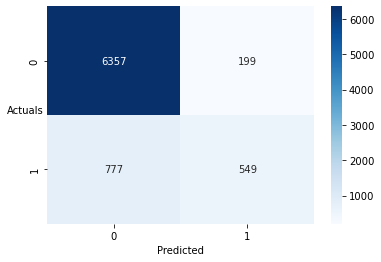

In [545]:
sns.heatmap((metrics.confusion_matrix(Default_train['Churn'],y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);

In [546]:
print(classification_report(Default_train['Churn'],y_class_pred))

              precision    recall  f1-score   support

           0       0.89      0.97      0.93      6556
           1       0.73      0.41      0.53      1326

    accuracy                           0.88      7882
   macro avg       0.81      0.69      0.73      7882
weighted avg       0.86      0.88      0.86      7882



In [547]:
y_prob_pred_test = model_2.predict(Default_test)

In [548]:
y_class_pred=[]
for i in range(0,len(y_prob_pred_test)):
    if np.array(y_prob_pred_test)[i]>0.5:
        a=1
    else:
        a=0
    y_class_pred.append(a)

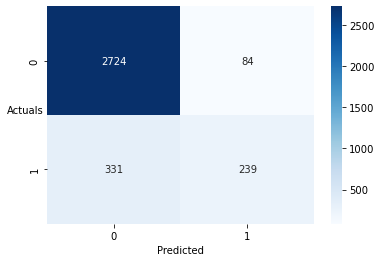

In [549]:
sns.heatmap((metrics.confusion_matrix(Default_test['Churn'],y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);

In [550]:
print(classification_report(Default_test['Churn'],y_class_pred))

              precision    recall  f1-score   support

           0       0.89      0.97      0.93      2808
           1       0.74      0.42      0.54       570

    accuracy                           0.88      3378
   macro avg       0.82      0.69      0.73      3378
weighted avg       0.87      0.88      0.86      3378



##### Choosing the optimal threshold

In [551]:
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(Default_train['Churn'],y_prob_pred_train)

In [552]:
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
optimal_threshold

0.24213782651063426

In [553]:
#Validating on the train set with revised threshold
y_class_pred=[]
for i in range(0,len(y_prob_pred_train)):
    if np.array(y_prob_pred_train)[i]>0.242:
        a=1
    else:
        a=0
    y_class_pred.append(a)

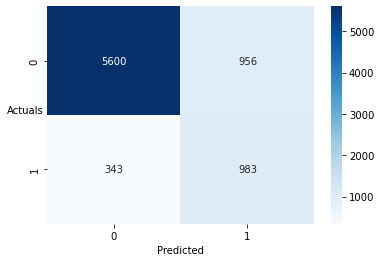

In [554]:
sns.heatmap((metrics.confusion_matrix(Default_train['Churn'],y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);

In [555]:
print(classification_report(Default_train['Churn'],y_class_pred))

              precision    recall  f1-score   support

           0       0.94      0.85      0.90      6556
           1       0.51      0.74      0.60      1326

    accuracy                           0.84      7882
   macro avg       0.72      0.80      0.75      7882
weighted avg       0.87      0.84      0.85      7882



In [556]:
#Validating on the test set
y_prob_pred_test = model_2.predict(Default_test)

In [557]:
y_class_pred=[]
for i in range(0,len(y_prob_pred_test)):
    if np.array(y_prob_pred_test)[i]>0.242:
        a=1
    else:
        a=0
    y_class_pred.append(a)

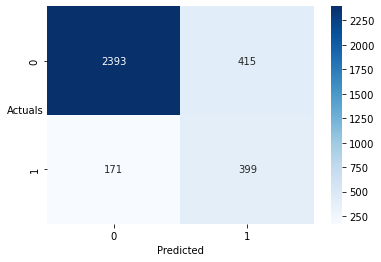

In [558]:
sns.heatmap((metrics.confusion_matrix(Default_test['Churn'],y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);

In [559]:
print(metrics.classification_report(Default_test['Churn'],y_class_pred))

              precision    recall  f1-score   support

           0       0.93      0.85      0.89      2808
           1       0.49      0.70      0.58       570

    accuracy                           0.83      3378
   macro avg       0.71      0.78      0.73      3378
weighted avg       0.86      0.83      0.84      3378



### 24- Linear Discriminant analysis

In [560]:
X = X.drop('Payment_E_wallet',axis=1)

In [561]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 1)

In [562]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

In [563]:
clf = LinearDiscriminantAnalysis()
LDA_classifier = clf.fit(X_train,y_train)

In [564]:
y_pred_train_lda = LDA_classifier.predict(X_train)
y_pred_test_lda = LDA_classifier.predict(X_test)

In [565]:
# training set classification report
print(classification_report(y_train, y_pred_train_lda))

              precision    recall  f1-score   support

           0       0.89      0.97      0.93      6556
           1       0.72      0.39      0.50      1326

    accuracy                           0.87      7882
   macro avg       0.81      0.68      0.72      7882
weighted avg       0.86      0.87      0.86      7882



In [566]:
# test set classification report
print(classification_report(y_test, y_pred_test_lda))

              precision    recall  f1-score   support

           0       0.89      0.97      0.93      2808
           1       0.71      0.39      0.50       570

    accuracy                           0.87      3378
   macro avg       0.80      0.68      0.71      3378
weighted avg       0.86      0.87      0.85      3378



In terms of recall, it is an underfit model

### 25- LDA using GridsearchCV

In [567]:
grid = {
    'solver': ['svd','lsqr', 'eigen'],
    'shrinkage': [None, 'auto'],
    'tol': [0.1,0.01,0.001,0.0001]
}

In [568]:
LDA_T = LinearDiscriminantAnalysis()

In [569]:
gridsearch = GridSearchCV(estimator = LDA_T, param_grid = grid, cv=5,n_jobs=-1,scoring='recall')

In [570]:
gridsearch.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=LinearDiscriminantAnalysis(), n_jobs=-1,
             param_grid={'shrinkage': [None, 'auto'],
                         'solver': ['svd', 'lsqr', 'eigen'],
                         'tol': [0.1, 0.01, 0.001, 0.0001]},
             scoring='recall')

In [571]:
gridsearch.best_params_

{'shrinkage': None, 'solver': 'svd', 'tol': 0.1}

In [572]:
best_model = gridsearch.best_estimator_

In [573]:
LDAT_train_pred = best_model.predict(X_train)
LDAT_test_pred = best_model.predict(X_test)

In [574]:
# training set classification report
print(classification_report(y_train, LDAT_train_pred))

              precision    recall  f1-score   support

           0       0.89      0.97      0.93      6556
           1       0.72      0.39      0.50      1326

    accuracy                           0.87      7882
   macro avg       0.81      0.68      0.72      7882
weighted avg       0.86      0.87      0.86      7882



In [575]:
# test set classification report
print(classification_report(y_test, LDAT_test_pred))

              precision    recall  f1-score   support

           0       0.89      0.97      0.93      2808
           1       0.71      0.39      0.50       570

    accuracy                           0.87      3378
   macro avg       0.80      0.68      0.71      3378
weighted avg       0.86      0.87      0.85      3378



### 26 - LDA using SMOTE

In [576]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=1)

X_train_res, y_train_res = sm.fit_resample(X_train, y_train)

In [577]:
y_train.value_counts()

0    6556
1    1326
Name: Churn, dtype: int64

In [578]:
y_train_res.value_counts()

0    6556
1    6556
Name: Churn, dtype: int64

In [579]:
clf = LinearDiscriminantAnalysis()
LDA_classifier = clf.fit(X_train_res,y_train_res)

In [580]:
y_pred_train_lda = LDA_classifier.predict(X_train_res)
y_pred_test_lda = LDA_classifier.predict(X_test)

In [581]:
# training set classification report
print(classification_report(y_train_res, y_pred_train_lda))

              precision    recall  f1-score   support

           0       0.81      0.81      0.81      6556
           1       0.81      0.81      0.81      6556

    accuracy                           0.81     13112
   macro avg       0.81      0.81      0.81     13112
weighted avg       0.81      0.81      0.81     13112



In [582]:
# training set classification report
print(classification_report(y_test, y_pred_test_lda))

              precision    recall  f1-score   support

           0       0.92      0.82      0.87      2808
           1       0.42      0.67      0.52       570

    accuracy                           0.79      3378
   macro avg       0.67      0.74      0.69      3378
weighted avg       0.84      0.79      0.81      3378



Overfit model